In [1]:
import os
import json
import gc
from glob import glob
from tqdm.auto import tqdm
from typing import List, Tuple, Optional, Any, Dict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
import albumentations as A
from albumentations.pytorch import ToTensorV2

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from evaluate import load

import segmentation_models_pytorch as smp
from torchmetrics.functional import dice
import wandb

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from operator import itemgetter
from PIL import Image

from collections import namedtuple

In [2]:
image_paths = sorted(list(glob('./data/leftImg8bit_trainvaltest/leftImg8bit/val/*/*.png')))
image_paths[:5]

['./data/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_000294_leftImg8bit.png',
 './data/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_000576_leftImg8bit.png',
 './data/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_001016_leftImg8bit.png',
 './data/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_001236_leftImg8bit.png',
 './data/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_001751_leftImg8bit.png']

In [3]:
label_paths = sorted(list(glob('./data/gtFine_trainvaltest/gtFine/val/*/*_gtFine_labelIds.png')))
label_paths[:5]

['./data/gtFine_trainvaltest/gtFine/val/frankfurt/frankfurt_000000_000294_gtFine_labelIds.png',
 './data/gtFine_trainvaltest/gtFine/val/frankfurt/frankfurt_000000_000576_gtFine_labelIds.png',
 './data/gtFine_trainvaltest/gtFine/val/frankfurt/frankfurt_000000_001016_gtFine_labelIds.png',
 './data/gtFine_trainvaltest/gtFine/val/frankfurt/frankfurt_000000_001236_gtFine_labelIds.png',
 './data/gtFine_trainvaltest/gtFine/val/frankfurt/frankfurt_000000_001751_gtFine_labelIds.png']

# Datasets

In [4]:
Label = namedtuple( 'Label' , [

    'name'        , # The identifier of this label, e.g. 'car', 'person', ... .
                    # We use them to uniquely name a class

    'id'          , # An integer ID that is associated with this label.
                    # The IDs are used to represent the label in ground truth images
                    # An ID of -1 means that this label does not have an ID and thus
                    # is ignored when creating ground truth images (e.g. license plate).
                    # Do not modify these IDs, since exactly these IDs are expected by the
                    # evaluation server.

    'trainId'     , # Feel free to modify these IDs as suitable for your method. Then create
                    # ground truth images with train IDs, using the tools provided in the
                    # 'preparation' folder. However, make sure to validate or submit results
                    # to our evaluation server using the regular IDs above!
                    # For trainIds, multiple labels might have the same ID. Then, these labels
                    # are mapped to the same class in the ground truth images. For the inverse
                    # mapping, we use the label that is defined first in the list below.
                    # For example, mapping all void-type classes to the same ID in training,
                    # might make sense for some approaches.
                    # Max value is 255!

    'category'    , # The name of the category that this label belongs to

    'categoryId'  , # The ID of this category. Used to create ground truth images
                    # on category level.

    'hasInstances', # Whether this label distinguishes between single instances or not

    'ignoreInEval', # Whether pixels having this class as ground truth label are ignored
                    # during evaluations or not

    'color'       , # The color of this label
    ] )


labels = [
    #       name                     id    trainId   category            catId     hasInstances   ignoreInEval   color
    Label(  'unlabeled'            ,  0 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'ego vehicle'          ,  1 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'rectification border' ,  2 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'out of roi'           ,  3 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'static'               ,  4 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'dynamic'              ,  5 ,      255 , 'void'            , 0       , False        , True         , (111, 74,  0) ),
    Label(  'ground'               ,  6 ,      255 , 'void'            , 0       , False        , True         , ( 81,  0, 81) ),
    Label(  'road'                 ,  7 ,        0 , 'flat'            , 1       , False        , False        , (128, 64,128) ),
    Label(  'sidewalk'             ,  8 ,        1 , 'flat'            , 1       , False        , False        , (244, 35,232) ),
    Label(  'parking'              ,  9 ,      255 , 'flat'            , 1       , False        , True         , (250,170,160) ),
    Label(  'rail track'           , 10 ,      255 , 'flat'            , 1       , False        , True         , (230,150,140) ),
    Label(  'building'             , 11 ,        2 , 'construction'    , 2       , False        , False        , ( 70, 70, 70) ),
    Label(  'wall'                 , 12 ,        3 , 'construction'    , 2       , False        , False        , (102,102,156) ),
    Label(  'fence'                , 13 ,        4 , 'construction'    , 2       , False        , False        , (190,153,153) ),
    Label(  'guard rail'           , 14 ,      255 , 'construction'    , 2       , False        , True         , (180,165,180) ),
    Label(  'bridge'               , 15 ,      255 , 'construction'    , 2       , False        , True         , (150,100,100) ),
    Label(  'tunnel'               , 16 ,      255 , 'construction'    , 2       , False        , True         , (150,120, 90) ),
    Label(  'pole'                 , 17 ,        5 , 'object'          , 3       , False        , False        , (153,153,153) ),
    Label(  'polegroup'            , 18 ,      255 , 'object'          , 3       , False        , True         , (153,153,153) ),
    Label(  'traffic light'        , 19 ,        6 , 'object'          , 3       , False        , False        , (250,170, 30) ),
    Label(  'traffic sign'         , 20 ,        7 , 'object'          , 3       , False        , False        , (220,220,  0) ),
    Label(  'vegetation'           , 21 ,        8 , 'nature'          , 4       , False        , False        , (107,142, 35) ),
    Label(  'terrain'              , 22 ,        9 , 'nature'          , 4       , False        , False        , (152,251,152) ),
    Label(  'sky'                  , 23 ,       10 , 'sky'             , 5       , False        , False        , ( 70,130,180) ),
    Label(  'person'               , 24 ,       11 , 'human'           , 6       , True         , False        , (220, 20, 60) ),
    Label(  'rider'                , 25 ,       12 , 'human'           , 6       , True         , False        , (255,  0,  0) ),
    Label(  'car'                  , 26 ,       13 , 'vehicle'         , 7       , True         , False        , (  0,  0,142) ),
    Label(  'truck'                , 27 ,       14 , 'vehicle'         , 7       , True         , False        , (  0,  0, 70) ),
    Label(  'bus'                  , 28 ,       15 , 'vehicle'         , 7       , True         , False        , (  0, 60,100) ),
    Label(  'caravan'              , 29 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0, 90) ),
    Label(  'trailer'              , 30 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0,110) ),
    Label(  'train'                , 31 ,       16 , 'vehicle'         , 7       , True         , False        , (  0, 80,100) ),
    Label(  'motorcycle'           , 32 ,       17 , 'vehicle'         , 7       , True         , False        , (  0,  0,230) ),
    Label(  'bicycle'              , 33 ,       18 , 'vehicle'         , 7       , True         , False        , (119, 11, 32) ),
    Label(  'license plate'        , -1 ,       -1 , 'vehicle'         , 7       , False        , True         , (  0,  0,142) ),
]

In [5]:
class CityScapesDataset(data.Dataset):
    def __init__(self, image_paths: List[str], mask_paths: List[str], stage: str = "train", image_size: int = 1024) -> None:
        super(CityScapesDataset, self).__init__()
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.image_size = image_size

        if stage == "train":
#             self.transforms = A.Compose([
#                 A.augmentations.Resize(height=self.image_size, width=self.image_size, interpolation=0),
#                 A.augmentations.Rotate(limit=90, p=0.5),
#                 A.augmentations.HorizontalFlip(p=0.5),
#                 A.augmentations.VerticalFlip(p=0.5),
#                 A.augmentations.transforms.ColorJitter(p=0.5),
# #                 A.Normalize(),
#                 A.pytorch.ToTensorV2(),
#             ])
            self.transforms = A.Compose([
                A.Resize(height=self.image_size, width=self.image_size, interpolation=0),
                A.Normalize( ),
#                 A.ToFloat(),
                ToTensorV2(),
            ])


        else:
            self.transforms = A.Compose([
                A.Resize(height=self.image_size, width=self.image_size, interpolation=0),
#                 A.Normalize(),
                A.ToFloat(),
                ToTensorV2()
            ])

        self.target_train_ids = []
        self.target_ids = []
        self.target_colors = []
        self.target_labels = []

        for label in labels:
            if label.trainId != 255 and label.trainId != -1:
                self.target_colors.append(label.color)
                self.target_labels.append(label.name)
                self.target_train_ids.append(label.trainId)
                self.target_ids.append(label.id)

        self.cmap = dict(zip(self.target_train_ids, self.target_colors))
        self.idmap = dict(zip(self.target_ids, self.target_train_ids))


    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, idx: int):
        image = np.array(Image.open(self.image_paths[idx]))
        mask = np.array(Image.open(self.mask_paths[idx]))

        transformed = self.transforms(image=image, mask=mask)

        image, mask = transformed['image'], transformed['mask']

        unique = pd.Series(mask.reshape(-1)).unique()

        for ele in unique:
            if ele not in self.idmap.keys():
                mask = mask.where(mask != ele, 255)

        unique = pd.Series(mask.reshape(-1)).unique()
        # print(unoq)
        for k, v in self.idmap.items():
            mask = mask.where(mask != k, v)
            
#         mask = F.one_hot(mask, num_classes=20)

        new_mask = torch.stack([mask]*3, axis=-1)
        new_mask.shape

        for k, v in self.cmap.items():
            # print(k, v)
            new_mask = new_mask.where(new_mask != k, torch.LongTensor(v))

        return {
            'image': image.clone(),
            'mask': mask,
            'colored': new_mask,
            'instance': np.array(Image.open(self.mask_paths[idx]))
        }

# Model

In [6]:
class SegmentationModel(nn.Module):
    def __init__(self):
        super(SegmentationModel, self).__init__()
        self.model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b5-finetuned-cityscapes-1024-1024",
            ignore_mismatched_sizes=True,
        )

    def forward(self, batch: Dict[str, torch.Tensor]) -> torch.Tensor:
        outputs = self.model(pixel_values=batch['image'])

        upsampled_logits = F.interpolate(
            outputs.logits,
            size=batch['mask'].shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        return upsampled_logits

## Inference

In [7]:
mean_iou = load("mean_iou")
model = SegmentationModel()
dataset = CityScapesDataset(image_paths, label_paths, image_size=1024, stage="train")
loader = data.DataLoader(dataset, batch_size=1, shuffle=True)

In [8]:
batch = next(iter(loader))
batch.keys()

dict_keys(['image', 'mask', 'colored', 'instance'])

In [9]:
batch['image'].shape

torch.Size([1, 3, 1024, 1024])

In [10]:
batch['mask'].shape

torch.Size([1, 1024, 1024])

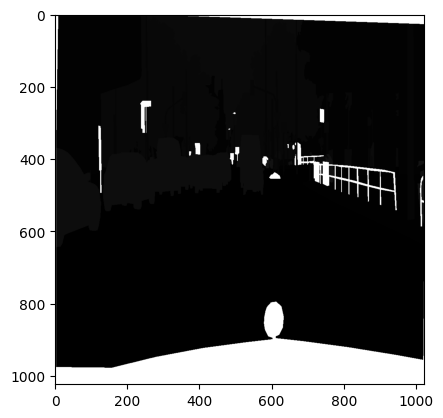

In [11]:
plt.imshow(batch['mask'][0], cmap='gray');

In [12]:
set(pd.Series(batch['mask'].reshape(-1)).unique())

{0, 1, 2, 3, 5, 6, 7, 8, 10, 11, 13, 17, 18, 255}

In [13]:
y = model(batch)
y.shape

torch.Size([1, 19, 1024, 1024])

In [14]:
pred = torch.argmax(F.softmax(y, 1), 1)
pred.shape

torch.Size([1, 1024, 1024])

In [15]:
loss_fct = nn.CrossEntropyLoss(ignore_index=255)

In [16]:
loss_fct(y, batch['mask'].to(dtype=torch.long))

tensor(0.1406, grad_fn=<NllLoss2DBackward0>)

In [17]:
(nn.Sigmoid()(y) > 0.5).shape

torch.Size([1, 19, 1024, 1024])

In [18]:
from pprint import pprint

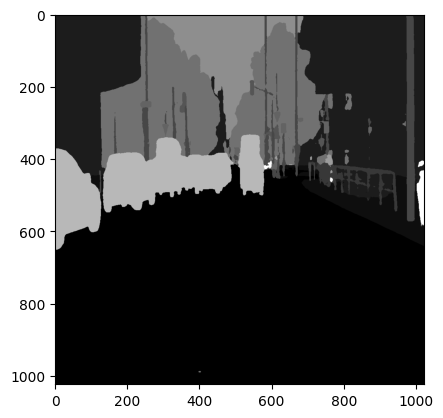

In [19]:
plt.imshow(pred[0], cmap='gray');

In [20]:
batch['mask'].to(dtype=torch.long)

tensor([[[255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         ...,
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255]]])

In [21]:
set(pd.Series(batch['mask'].reshape(-1)).unique())

{0, 1, 2, 3, 5, 6, 7, 8, 10, 11, 13, 17, 18, 255}

In [22]:
import time

In [23]:
def dice_coef(y_pred: torch.Tensor, y_true: torch.Tensor, thr: float = 0.5, eps: float = 1e-6) -> torch.Tensor:
    y_true = y_true.to(dtype=torch.float32)
    y_pred = (y_pred > thr).to(dtype=torch.float32)
    intersection = 2.0 * (y_true * y_pred).sum() + eps
    denominator  = y_pred.sum() + y_true.sum() + eps
    dice = intersection / denominator
    return dice.mean()

def iou_coef(y_pred: torch.Tensor, y_true: torch.Tensor, thr: float = 0.5, eps: float = 1e-6) -> torch.Tensor:
    y_true = y_true.to(dtype=torch.float32)
    y_pred = (y_pred > thr).to(dtype=torch.float32)
    intersection = (y_true * y_pred).sum() + eps
    union        = y_true.sum() + y_pred.sum() - intersection + eps
    return intersection / union

In [24]:

class iouEval:

    def __init__(self, nClasses, ignoreIndex=7):
        self.nClasses = nClasses
        self.ignoreIndex = ignoreIndex if nClasses>ignoreIndex else -1 #if ignoreIndex is larger than nClasses, consider no ignoreIndex
        self.reset()

    def reset (self):
        classes = self.nClasses if self.ignoreIndex==-1 else self.nClasses-1
        self.tp = torch.zeros(classes).double()
        self.fp = torch.zeros(classes).double()
        self.fn = torch.zeros(classes).double()        

    def addBatch(self, x, y):   #x=preds, y=targets
        #sizes should be "batch_size x nClasses x H x W"
        
        #print ("X is cuda: ", x.is_cuda)
        #print ("Y is cuda: ", y.is_cuda)

        if (x.is_cuda or y.is_cuda):
            x = x.cuda()
            y = y.cuda()

        #if size is "batch_size x 1 x H x W" scatter to onehot
        if (x.size(1) == 1):
            x_onehot = torch.zeros(x.size(0), self.nClasses, x.size(2), x.size(3))  
            if x.is_cuda:
                x_onehot = x_onehot.cuda()
            x_onehot.scatter_(1, x, 1).float()
        else:
            x_onehot = x.float()

        if (y.size(1) == 1):
            y_onehot = torch.zeros(y.size(0), self.nClasses, y.size(2), y.size(3))
            if y.is_cuda:
                y_onehot = y_onehot.cuda()
            y_onehot.scatter_(1, y, 1).float()
        else:
            y_onehot = y.float()

        if (self.ignoreIndex != -1): 
            ignores = y_onehot[:,self.ignoreIndex].unsqueeze(1)
            x_onehot = x_onehot[:, :self.ignoreIndex]
            y_onehot = y_onehot[:, :self.ignoreIndex]
        else:
            ignores=0

        #print(type(x_onehot))
        #print(type(y_onehot))
        #print(x_onehot.size())
        #print(y_onehot.size())

        tpmult = x_onehot * y_onehot    #times prediction and gt coincide is 1
        tp = torch.sum(torch.sum(torch.sum(tpmult, dim=0, keepdim=True), dim=2, keepdim=True), dim=3, keepdim=True).squeeze()
        fpmult = x_onehot * (1-y_onehot-ignores) #times prediction says its that class and gt says its not (subtracting cases when its ignore label!)
        fp = torch.sum(torch.sum(torch.sum(fpmult, dim=0, keepdim=True), dim=2, keepdim=True), dim=3, keepdim=True).squeeze()
        fnmult = (1-x_onehot) * (y_onehot) #times prediction says its not that class and gt says it is
        fn = torch.sum(torch.sum(torch.sum(fnmult, dim=0, keepdim=True), dim=2, keepdim=True), dim=3, keepdim=True).squeeze() 

        self.tp += tp.double().cpu()
        self.fp += fp.double().cpu()
        self.fn += fn.double().cpu()

    def getIoU(self):
        num = self.tp
        den = self.tp + self.fp + self.fn + 1e-15
        iou = num / den
        return torch.mean(iou), iou     #returns "iou mean", "iou per class"

In [25]:
batch['mask'].shape

torch.Size([1, 1024, 1024])

  0%|          | 0/500 [00:00<?, ?it/s]

torch.Size([1, 19, 1024, 1024])
Execution Time: 21.53220796585083


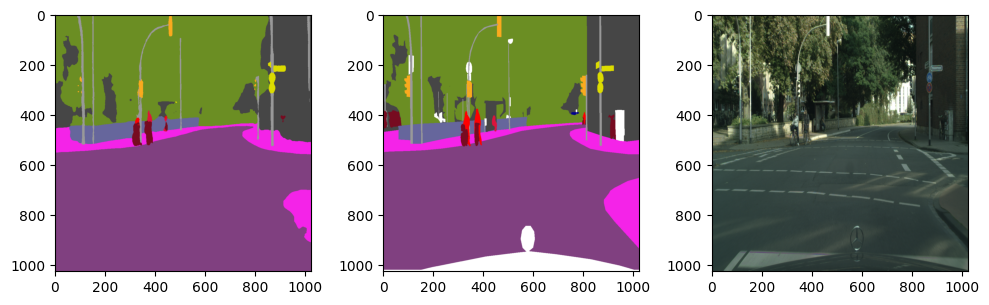

Overall:-


/Users/aneeshaparajit/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/Users/aneeshaparajit/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


{'mean_accuracy': 0.6035607655814125,
 'mean_iou': 0.5179391856471842,
 'overall_accuracy': 0.9337572371762316,
 'per_category_accuracy': array([0.99633877, 0.7822113 , 0.82116758, 0.91515944,        nan,
       0.75234491, 0.42751713, 0.92126235, 0.96823841,        nan,
              nan, 0.18240621, 0.07866667, 0.        ,        nan,
              nan,        nan,        nan, 0.39741641,        nan]),
 'per_category_iou': array([0.88093305, 0.72241804, 0.6958468 , 0.78367   ,        nan,
       0.50783072, 0.40381743, 0.83453653, 0.88308896,        nan,
              nan, 0.09637731, 0.07678293, 0.        ,        nan,
              nan,        nan,        nan, 0.32996845,        nan])}
 
Cross Entropy Loss: 0.227591410279274
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.354376792907715


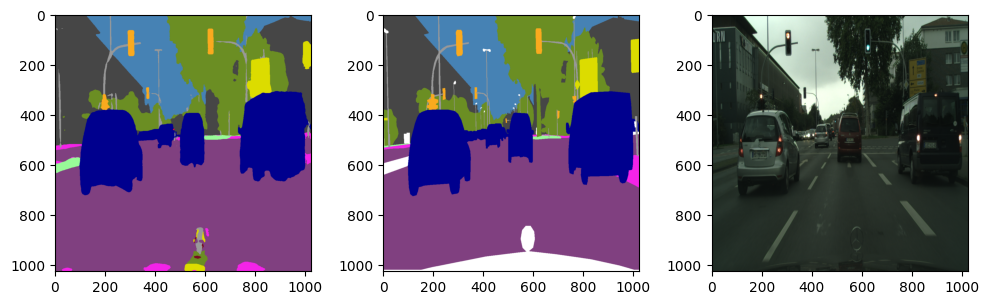

Overall:-
{'mean_accuracy': 0.796613434371483,
 'mean_iou': 0.543552393039103,
 'overall_accuracy': 0.9440031565803848,
 'per_category_accuracy': array([0.9819828 , 0.31423321, 0.92059886,        nan,        nan,
       0.54432961, 0.7735208 , 0.91588478, 0.88459718, 0.67260195,
       0.98655855,        nan,        nan, 0.9718266 ,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.88479756, 0.13027218, 0.79603444,        nan,        nan,
       0.38686788, 0.74708612, 0.7263503 , 0.78721733, 0.19928523,
       0.92977625, 0.        ,        nan, 0.93494144,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.17267481982707977
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 31.02757501602173


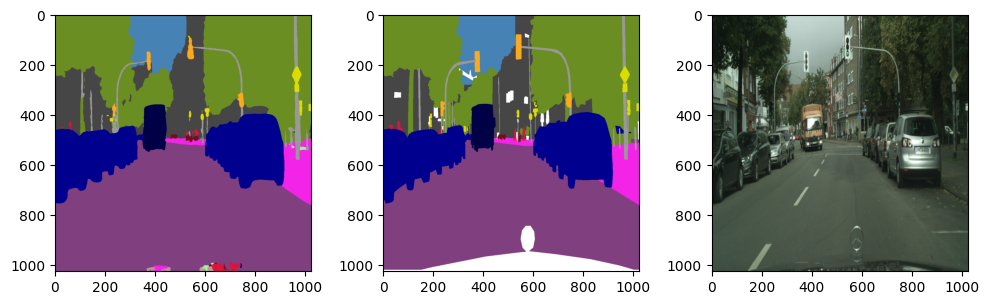

Overall:-
{'mean_accuracy': 0.8184872866206289,
 'mean_iou': 0.6032100260611183,
 'overall_accuracy': 0.9582390990833839,
 'per_category_accuracy': array([0.98889046, 0.94822845, 0.92065871,        nan,        nan,
       0.70821645, 0.6697582 , 0.76824285, 0.96403629,        nan,
       0.89799275, 0.35681293,        nan, 0.97974848, 0.96914366,
              nan,        nan,        nan, 0.6501182 ,        nan]),
 'per_category_iou': array([0.8847913 , 0.85199642, 0.74650687,        nan, 0.        ,
       0.56387558, 0.65204773, 0.66949296, 0.90988421, 0.        ,
       0.86074061, 0.14055038,        nan, 0.94757459, 0.9295216 ,
              nan,        nan,        nan, 0.28795812,        nan])}
 
Cross Entropy Loss: 0.13694407045841217
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 37.010618925094604


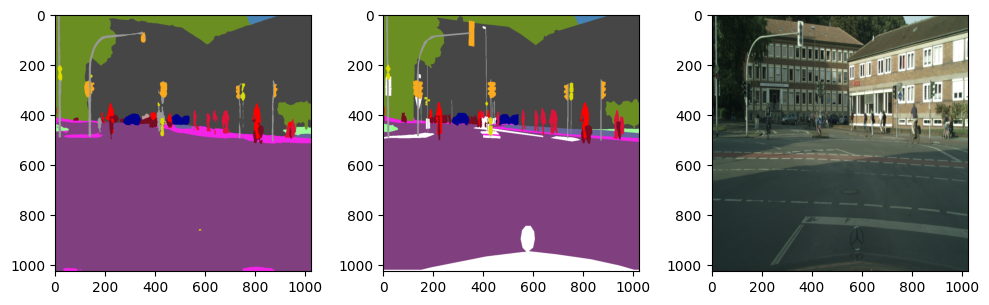

Overall:-
{'mean_accuracy': 0.7244173377931995,
 'mean_iou': 0.5505780701308631,
 'overall_accuracy': 0.957987222398671,
 'per_category_accuracy': array([0.98746153, 0.77082481, 0.98561255, 0.21347342,        nan,
       0.70145401, 0.57514598, 0.70100097, 0.96253935, 0.67398509,
       0.94202349, 0.57475008, 0.64745822, 0.84745763,        nan,
              nan,        nan,        nan, 0.55865559,        nan]),
 'per_category_iou': array([0.89737123, 0.26633379, 0.92849699, 0.20752223, 0.        ,
       0.47899653, 0.54887947, 0.60591683, 0.87866422, 0.4786702 ,
       0.74032162, 0.50573236, 0.48831408, 0.79474775,        nan,
              nan,        nan,        nan, 0.43870376,        nan])}
 
Cross Entropy Loss: 0.15344591438770294
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 32.12365198135376


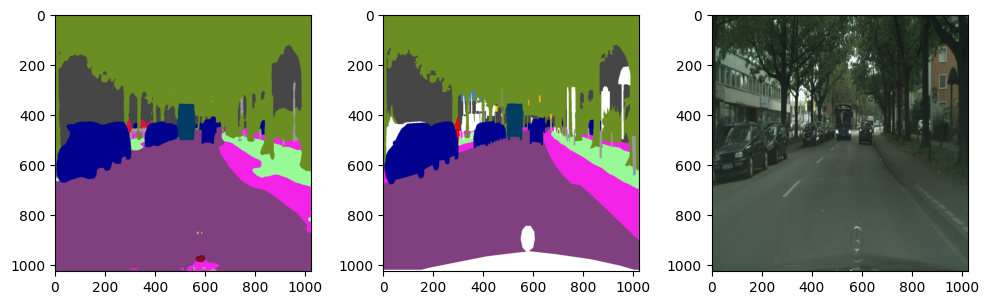

Overall:-
{'mean_accuracy': 0.4685344428988761,
 'mean_iou': 0.35683469974784326,
 'overall_accuracy': 0.9498313319713192,
 'per_category_accuracy': array([0.992734  , 0.69158831, 0.91680919,        nan,        nan,
       0.09502562, 0.05769231, 0.        , 0.98114823, 0.87074509,
       0.        ,        nan, 0.        , 0.97868511, 0.        ,
       0.97505435,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.86429398, 0.62723334, 0.74066169,        nan, 0.        ,
       0.05511887, 0.05769231, 0.        , 0.90827934, 0.68625991,
       0.        , 0.        , 0.        , 0.90980365, 0.        ,
       0.86001211,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.16975170373916626
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.464184999465942


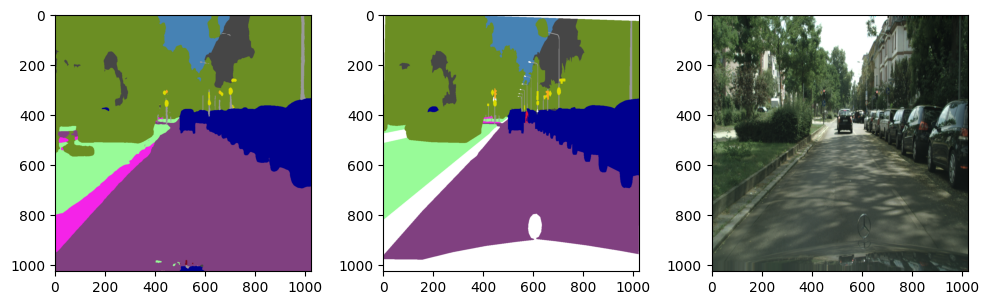

Overall:-
{'mean_accuracy': 0.6617390562338387,
 'mean_iou': 0.48251766591167033,
 'overall_accuracy': 0.967214723379107,
 'per_category_accuracy': array([0.98777938, 0.11015491, 0.88721468,        nan,        nan,
       0.64323087, 0.22442748, 0.67085202, 0.98802234, 0.86463855,
       0.91531452, 0.        ,        nan, 0.98749487,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.7584261 , 0.00196905, 0.80050775,        nan, 0.        ,
       0.42654234, 0.21875   , 0.58323587, 0.90587678, 0.82032332,
       0.83858024, 0.        ,        nan, 0.91851822,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.09115250408649445
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.331095218658447


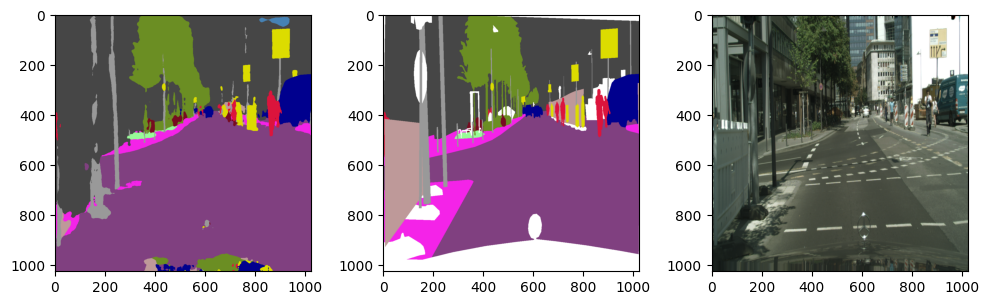

Overall:-
{'mean_accuracy': 0.7144083257087769,
 'mean_iou': 0.4357965355033823,
 'overall_accuracy': 0.8378515103588294,
 'per_category_accuracy': array([0.99039315, 0.25470211, 0.96362944,        nan, 0.04362643,
       0.58675161,        nan, 0.93720096, 0.93046105, 0.87766221,
              nan, 0.72893119,        nan, 0.93760656,        nan,
              nan,        nan,        nan, 0.60752688,        nan]),
 'per_category_iou': array([0.72914187, 0.22928906, 0.67322792,        nan, 0.04183582,
       0.40726894,        nan, 0.67640288, 0.73835357, 0.56831302,
       0.        , 0.59685014, 0.        , 0.70795402,        nan,
              nan,        nan,        nan, 0.29671772,        nan])}
 
Cross Entropy Loss: 0.9719384908676147
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.80062699317932


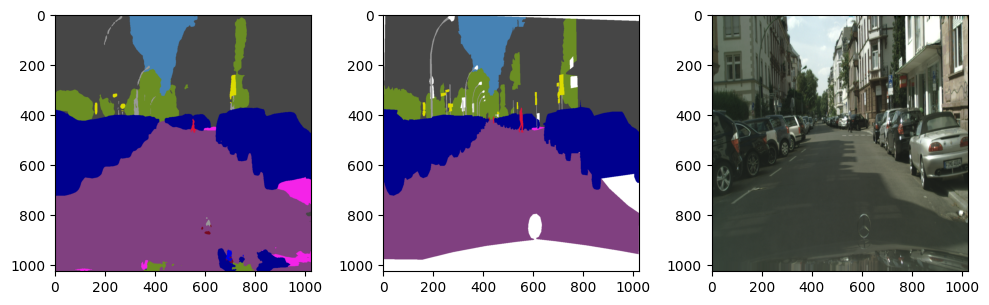

Overall:-
{'mean_accuracy': 0.6259381363227434,
 'mean_iou': 0.4424720750459161,
 'overall_accuracy': 0.963555755936279,
 'per_category_accuracy': array([0.98125044, 0.88976378, 0.98790356,        nan,        nan,
       0.27005023,        nan, 0.6341039 , 0.78464528,        nan,
       0.99393659, 0.35914333, 0.        , 0.98452238,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.80861347, 0.02173913, 0.8734453 ,        nan,        nan,
       0.20302123,        nan, 0.5888735 , 0.68344796,        nan,
       0.92708198, 0.32561613, 0.        , 0.8778262 ,        nan,
              nan,        nan, 0.        , 0.        ,        nan])}
 
Cross Entropy Loss: 0.11618565022945404
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.31090998649597


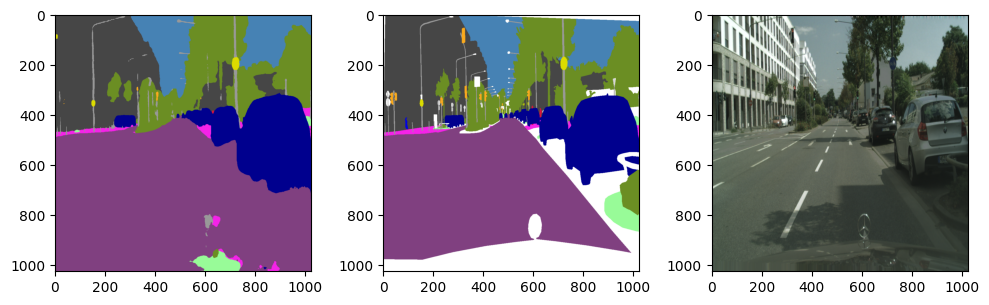

Overall:-
{'mean_accuracy': 0.6098810843890846,
 'mean_iou': 0.49092634232059834,
 'overall_accuracy': 0.9418395937060264,
 'per_category_accuracy': array([0.99613667, 0.6946391 , 0.96068997,        nan,        nan,
       0.56315402, 0.11094542, 0.86805556, 0.90025759, 0.0369829 ,
       0.9583239 , 0.24431818,        nan, 0.98506972,        nan,
              nan,        nan, 0.        ,        nan,        nan]),
 'per_category_iou': array([0.73466814, 0.33135551, 0.8666598 ,        nan,        nan,
       0.37745728, 0.10992908, 0.7367387 , 0.80225416, 0.02155209,
       0.85932863, 0.24293785,        nan, 0.80823486,        nan,
              nan,        nan, 0.        ,        nan,        nan])}
 
Cross Entropy Loss: 0.28483328223228455
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.742867946624756


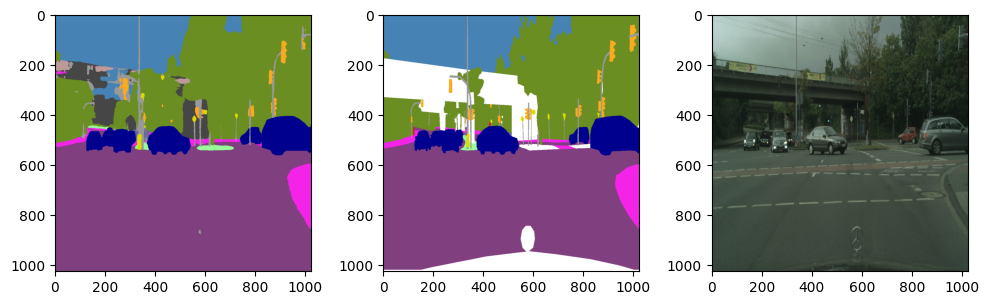

Overall:-
{'mean_accuracy': 0.6414692409706878,
 'mean_iou': 0.4215947705839309,
 'overall_accuracy': 0.9635265020577047,
 'per_category_accuracy': array([0.99098624, 0.8479935 ,        nan, 0.        ,        nan,
       0.73708349, 0.50446957, 0.71529412, 0.96774051, 0.37083888,
       0.93521741, 0.        ,        nan, 0.98653792,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.88550934, 0.73169921, 0.        , 0.        , 0.        ,
       0.33381374, 0.39661304, 0.43243243, 0.80543516, 0.11508264,
       0.83717439, 0.        ,        nan, 0.94297206,        nan,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.10567566752433777
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.85518789291382


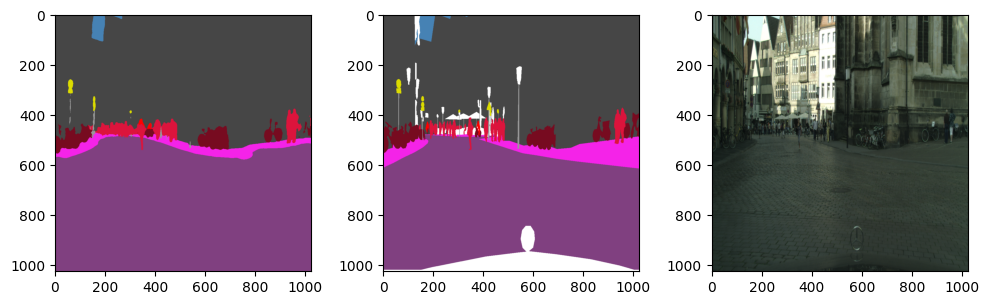

Overall:-
{'mean_accuracy': 0.6622758779343898,
 'mean_iou': 0.5784309894039787,
 'overall_accuracy': 0.9570128580303426,
 'per_category_accuracy': array([0.99600226, 0.51338226, 0.99115711,        nan,        nan,
       0.18070226,        nan, 0.58326325,        nan,        nan,
       0.81522446, 0.87497786, 0.25241546,        nan,        nan,
              nan,        nan,        nan, 0.75335798,        nan]),
 'per_category_iou': array([0.85976234, 0.48199955, 0.92876922,        nan,        nan,
       0.14595342,        nan, 0.53926905,        nan,        nan,
       0.75300481, 0.66791331, 0.15845337,        nan,        nan,
              nan,        nan,        nan, 0.67075383,        nan])}
 
Cross Entropy Loss: 0.1453753262758255
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.798530101776123


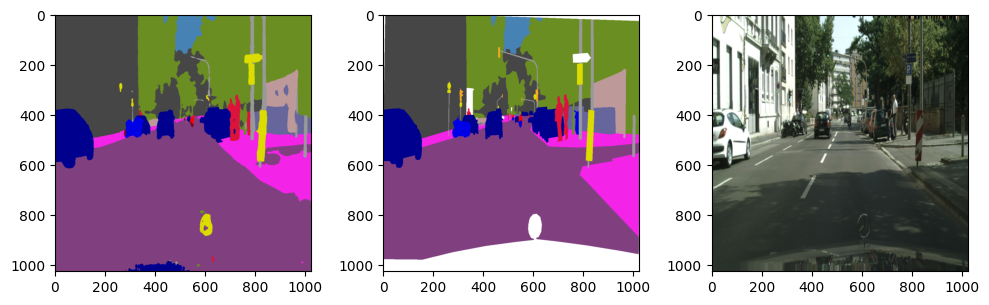

Overall:-
{'mean_accuracy': 0.7620151777348696,
 'mean_iou': 0.5760985391074744,
 'overall_accuracy': 0.9334223915020022,
 'per_category_accuracy': array([0.96545333, 0.70883534, 0.97843886, 0.7204317 , 0.80836171,
       0.86668642, 0.046875  , 0.94073705, 0.9564755 ,        nan,
       0.96153544, 0.78111078, 0.33756345, 0.94202899,        nan,
              nan,        nan, 0.65367893,        nan,        nan]),
 'per_category_iou': array([0.76028844, 0.59317684, 0.91321866, 0.5089295 , 0.79538368,
       0.62900452, 0.04664484, 0.50326362, 0.86506213,        nan,
       0.82029258, 0.54598298, 0.26868687, 0.80319303,        nan,
              nan,        nan, 0.58835039, 0.        ,        nan])}
 
Cross Entropy Loss: 0.2953357994556427
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.232563972473145


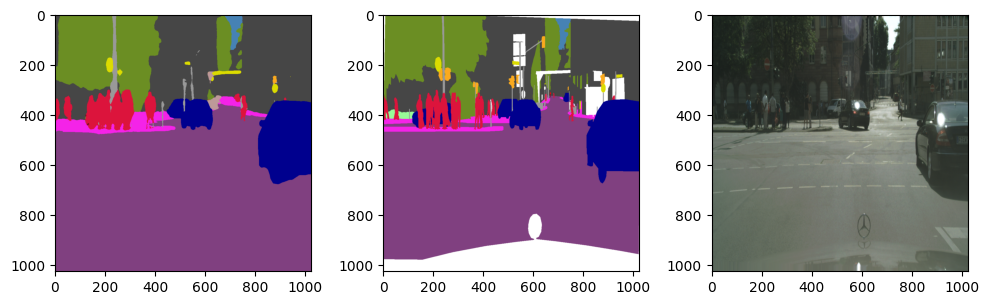

Overall:-
{'mean_accuracy': 0.5770407234672361,
 'mean_iou': 0.4041981962949657,
 'overall_accuracy': 0.9196071430136122,
 'per_category_accuracy': array([0.97343061, 0.74908603, 0.89661803,        nan,        nan,
       0.44794846, 0.08865248, 0.73466258, 0.86674537, 0.        ,
       0.95495939, 0.8563441 , 0.        , 0.93308236,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.80222568, 0.45741712, 0.69392666,        nan, 0.        ,
       0.28591011, 0.08863399, 0.37761135, 0.75950008, 0.        ,
       0.71785384, 0.61781223, 0.        , 0.85788368,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.3246326148509979
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.700740814208984


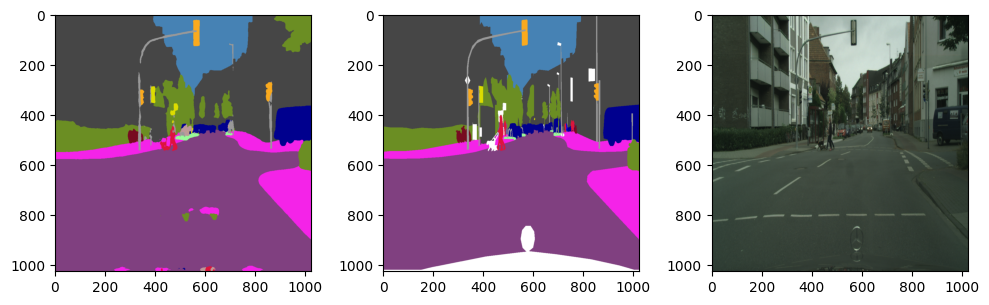

Overall:-
{'mean_accuracy': 0.7089094884868485,
 'mean_iou': 0.47348168232065646,
 'overall_accuracy': 0.9497684046045122,
 'per_category_accuracy': array([0.98685294, 0.96350785, 0.94096663, 0.        ,        nan,
       0.48801291, 0.89046334, 0.93690249, 0.89836631, 0.84304047,
       0.97907812, 0.430213  ,        nan, 0.85174289,        nan,
              nan,        nan, 0.        , 0.71558589,        nan]),
 'per_category_iou': array([0.88857522, 0.85517898, 0.88312201, 0.        , 0.        ,
       0.39167438, 0.75712373, 0.46666667, 0.6457876 , 0.46112311,
       0.94441224, 0.29863813,        nan, 0.79985312, 0.        ,
       0.        ,        nan, 0.        , 0.65703343,        nan])}
 
Cross Entropy Loss: 0.21454572677612305
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.804800987243652


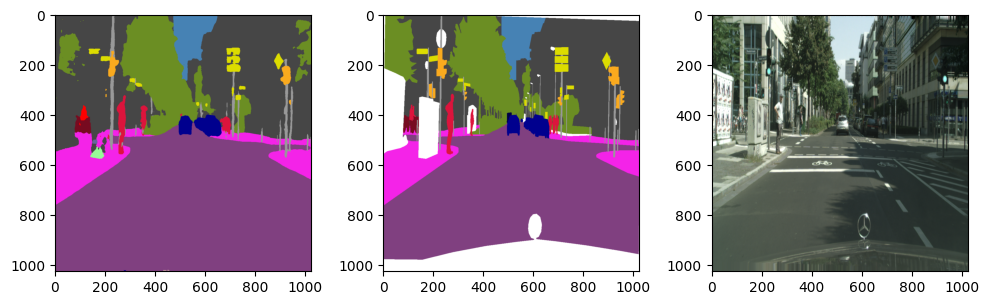

Overall:-
{'mean_accuracy': 0.7680203239195608,
 'mean_iou': 0.4878088929999363,
 'overall_accuracy': 0.9255698834804426,
 'per_category_accuracy': array([0.98654167, 0.96218772, 0.92691663,        nan,        nan,
       0.61720954, 0.52156646, 0.81509577, 0.79979837,        nan,
       0.96832256, 0.77695455,        nan, 0.94234286, 0.        ,
              nan,        nan,        nan, 0.89930774,        nan]),
 'per_category_iou': array([0.79100115, 0.80124502, 0.67117329, 0.        , 0.        ,
       0.40311571, 0.51113514, 0.77665342, 0.7096631 , 0.        ,
       0.88520252, 0.61935825, 0.        , 0.88959564, 0.        ,
              nan,        nan,        nan, 0.74679906,        nan])}
 
Cross Entropy Loss: 0.21769021451473236
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.81458592414856


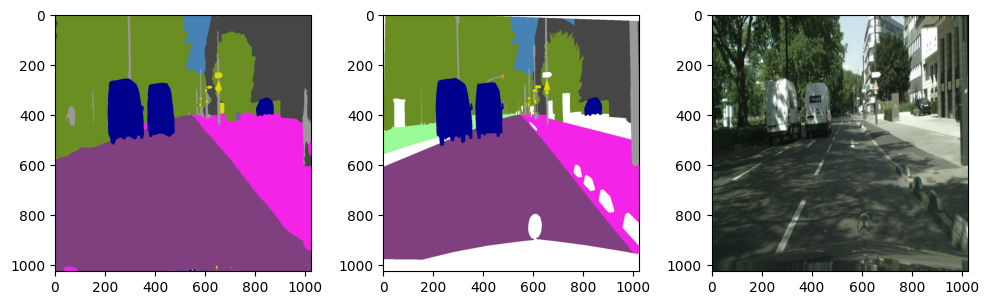

Overall:-
{'mean_accuracy': 0.6837296412881558,
 'mean_iou': 0.4614470401169772,
 'overall_accuracy': 0.9445180060891026,
 'per_category_accuracy': array([0.99654948, 0.97508204, 0.97939514,        nan,        nan,
       0.36218334, 0.        , 0.64746835, 0.98733699, 0.        ,
       0.92640043,        nan,        nan, 0.96288063,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.76971455, 0.73750299, 0.74913783, 0.        , 0.        ,
       0.31152436, 0.        , 0.32589997, 0.84541644, 0.        ,
       0.85389594,        nan,        nan, 0.94427239,        nan,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.3253396153450012
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.4223051071167


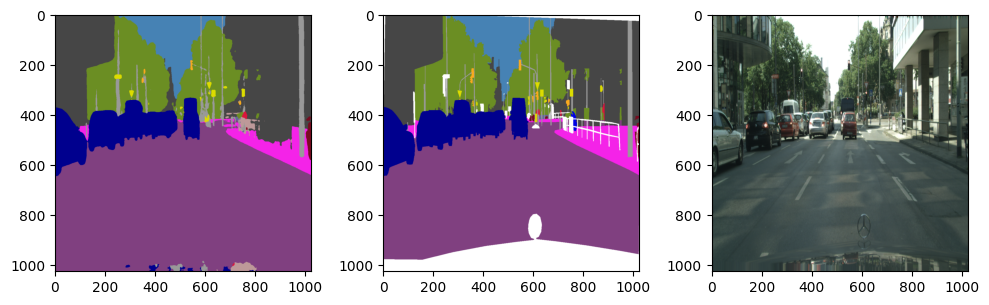

Overall:-
{'mean_accuracy': 0.6139433111274607,
 'mean_iou': 0.4719661786116042,
 'overall_accuracy': 0.9538498036046615,
 'per_category_accuracy': array([0.99063312, 0.71586049, 0.9638907 , 0.        ,        nan,
       0.73486075, 0.32865028, 0.66009654, 0.93662321,        nan,
       0.95929581, 0.        ,        nan, 0.98491181,        nan,
              nan,        nan, 0.        , 0.70644034,        nan]),
 'per_category_iou': array([0.81364283, 0.66608749, 0.82963965, 0.        , 0.        ,
       0.49244847, 0.31205336, 0.44375338, 0.84757516,        nan,
       0.87505783, 0.        ,        nan, 0.92607751,        nan,
              nan,        nan, 0.        , 0.40119081,        nan])}
 
Cross Entropy Loss: 0.1797647327184677
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.70931601524353


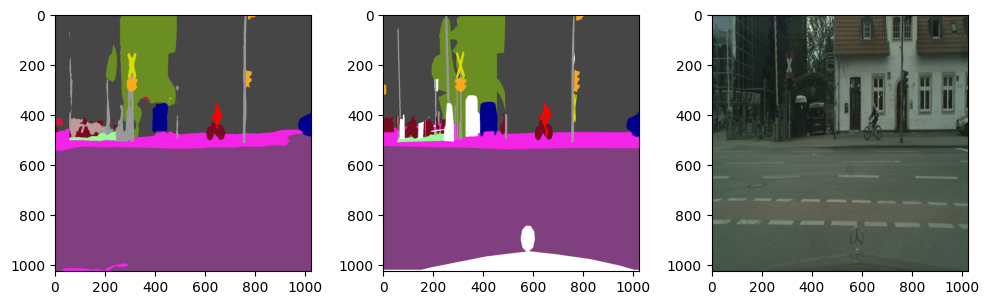

Overall:-
{'mean_accuracy': 0.7591597165039606,
 'mean_iou': 0.522710721812783,
 'overall_accuracy': 0.9453889219285113,
 'per_category_accuracy': array([0.99600214, 0.79339758, 0.97368751,        nan,        nan,
       0.62378609, 0.71391933, 0.62546262, 0.84146462, 0.74910196,
              nan,        nan, 0.75818252, 0.82869971,        nan,
              nan,        nan,        nan, 0.4470528 ,        nan]),
 'per_category_iou': array([0.88970633, 0.71075718, 0.87333953,        nan, 0.        ,
       0.38090532, 0.65135078, 0.50918951, 0.76551485, 0.59726812,
              nan, 0.        , 0.72630026, 0.80096804, 0.        ,
              nan,        nan,        nan, 0.4126502 ,        nan])}
 
Cross Entropy Loss: 0.20383679866790771
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.110806941986084


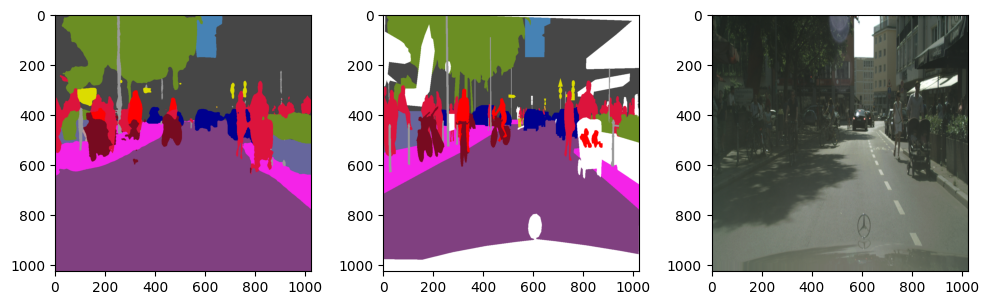

Overall:-
{'mean_accuracy': 0.6476949569126381,
 'mean_iou': 0.4513138468577047,
 'overall_accuracy': 0.8894721241162966,
 'per_category_accuracy': array([0.99144573, 0.76731909, 0.90729114, 0.1848665 ,        nan,
       0.36990973, 0.23076923, 0.47420417, 0.93794069,        nan,
       0.98082126, 0.67186151, 0.40252577, 0.78650074,        nan,
              nan,        nan,        nan, 0.71457889,        nan]),
 'per_category_iou': array([0.7627334 , 0.57959525, 0.61163043, 0.07012349, 0.        ,
       0.27905569, 0.23076923, 0.16115394, 0.71326284,        nan,
       0.86740798, 0.43292441, 0.33173825, 0.73175148,        nan,
              nan,        nan,        nan, 0.54624749,        nan])}
 
Cross Entropy Loss: 0.37490057945251465
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.98200488090515


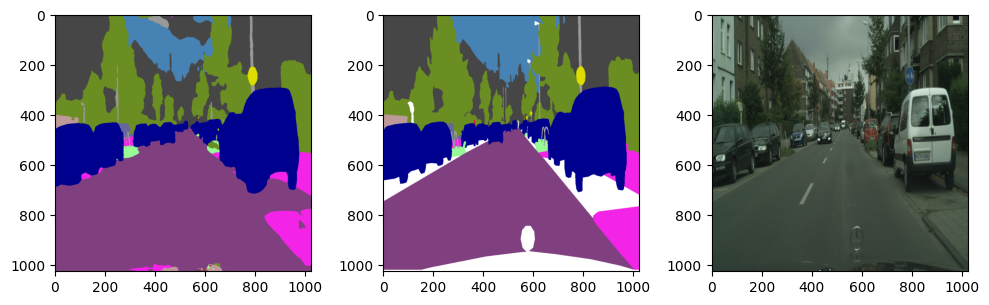

Overall:-
{'mean_accuracy': 0.7532075494707383,
 'mean_iou': 0.6097037271700799,
 'overall_accuracy': 0.9440138294891653,
 'per_category_accuracy': array([0.99803562, 0.88312672, 0.97998485, 0.7455516 , 0.82089129,
       0.50312935,        nan, 0.90251962, 0.91617047, 0.62823745,
       0.67632167, 0.        ,        nan, 0.98452196,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.79990629, 0.76075514, 0.80239544, 0.39528302, 0.51176783,
       0.27087233,        nan, 0.8285931 , 0.87094689, 0.50693545,
       0.65754039, 0.        ,        nan, 0.91144883,        nan,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.15760651230812073
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.916159868240356


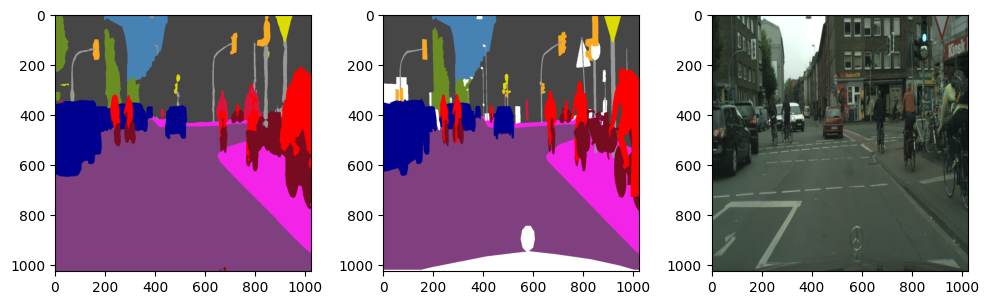

Overall:-
{'mean_accuracy': 0.7714570379767363,
 'mean_iou': 0.608202990397032,
 'overall_accuracy': 0.9300308409940092,
 'per_category_accuracy': array([0.98841458, 0.93324585, 0.93245232,        nan,        nan,
       0.63661022, 0.58145806, 0.87806778, 0.8275217 ,        nan,
       0.98350998, 0.        , 0.66380722, 0.98115627,        nan,
              nan,        nan,        nan, 0.85124048,        nan]),
 'per_category_iou': array([0.87978621, 0.90164404, 0.83419955, 0.        ,        nan,
       0.42913619, 0.55077953, 0.75548852, 0.53977831,        nan,
       0.93964774, 0.        , 0.57050645, 0.90331878,        nan,
              nan,        nan,        nan, 0.60235356,        nan])}
 
Cross Entropy Loss: 0.2835601568222046
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.12817692756653


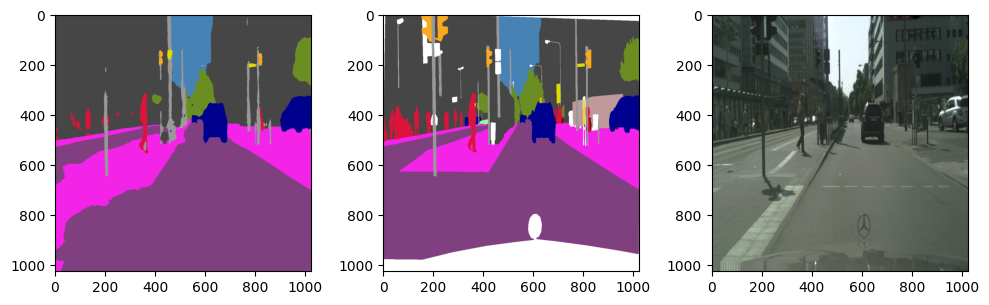

Overall:-
{'mean_accuracy': 0.5168685147508358,
 'mean_iou': 0.4286153495204638,
 'overall_accuracy': 0.8627559112388715,
 'per_category_accuracy': array([0.85711258, 0.95795696, 0.96494958,        nan, 0.00500278,
       0.49871426, 0.13899868, 0.15193247, 0.8534285 , 0.        ,
       0.98355732, 0.36147246,        nan, 0.94616509,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.6815991 , 0.57969368, 0.75805783,        nan, 0.00497375,
       0.34034427, 0.13804383, 0.11522911, 0.78504673, 0.        ,
       0.92514124, 0.33796256,        nan, 0.90590744,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.7839928865432739
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.65191388130188


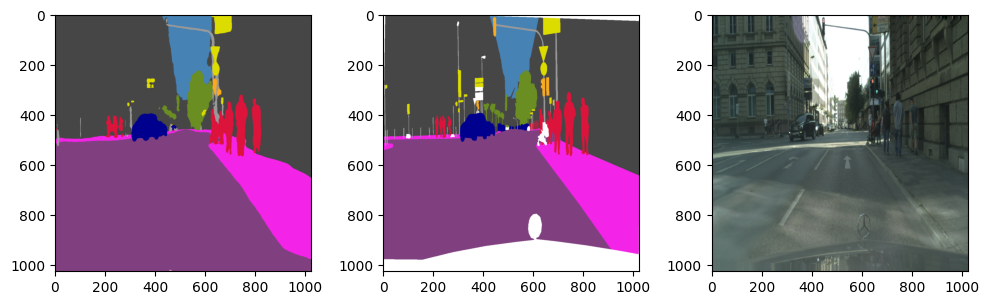

Overall:-
{'mean_accuracy': 0.7878109922353757,
 'mean_iou': 0.5607014037170158,
 'overall_accuracy': 0.9521792541752065,
 'per_category_accuracy': array([0.9876085 , 0.93646956, 0.9588201 ,        nan,        nan,
       0.30985464, 0.32857143, 0.70602454, 0.9062596 ,        nan,
       0.98055365, 0.90763004,        nan, 0.85631786,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.76126118, 0.87175227, 0.8855632 ,        nan, 0.        ,
       0.21079037, 0.30594147, 0.59663734, 0.7565641 ,        nan,
       0.78580923, 0.72479119,        nan, 0.82930649,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.18068894743919373
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.956468105316162


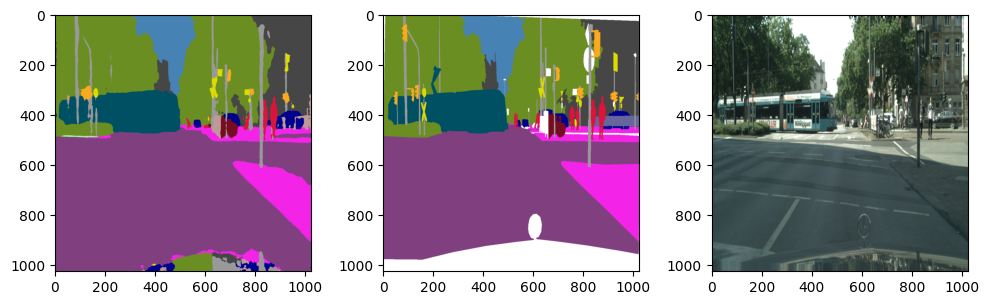

Overall:-
{'mean_accuracy': 0.716818473535938,
 'mean_iou': 0.5008694582489298,
 'overall_accuracy': 0.9345657175477442,
 'per_category_accuracy': array([0.99086452, 0.84977147, 0.89657495, 0.        ,        nan,
       0.71044764, 0.31970613, 0.50597015, 0.97142909,        nan,
       0.95957969, 0.60642119,        nan, 0.75304707,        nan,
              nan, 0.93486352,        nan, 0.81996474,        nan]),
 'per_category_iou': array([0.8367279 , 0.72810656, 0.73288918, 0.        , 0.        ,
       0.40456644, 0.28474934, 0.37273227, 0.83446866, 0.        ,
       0.90885536, 0.52405898,        nan, 0.26938556,        nan,
              nan, 0.89059446,        nan, 0.72590714,        nan])}
 
Cross Entropy Loss: 0.26498308777809143
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 29.510677099227905


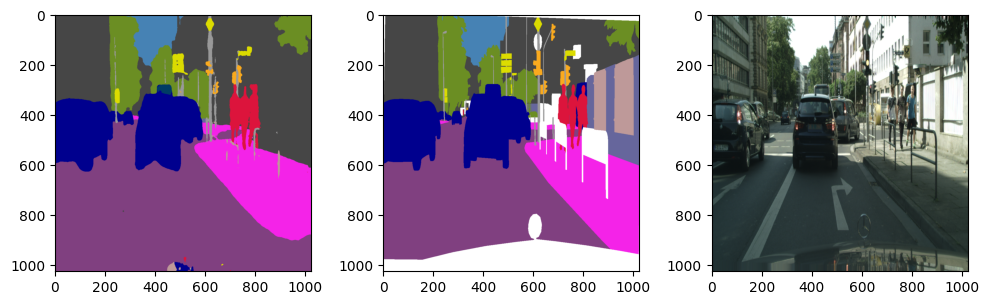

Overall:-
{'mean_accuracy': 0.7144897180823703,
 'mean_iou': 0.5365054355886171,
 'overall_accuracy': 0.8725547336670475,
 'per_category_accuracy': array([0.96956398, 0.90598663, 0.96113559, 0.        , 0.        ,
       0.58296713, 0.49461488, 0.84905966, 0.96292909,        nan,
       0.9510842 , 0.93896346,        nan, 0.957572  ,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.70749359, 0.82465289, 0.60079879, 0.        , 0.        ,
       0.36559555, 0.4796645 , 0.65957179, 0.8294288 ,        nan,
       0.88791217, 0.72988022,        nan, 0.88957237,        nan,
       0.        ,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 1.2901594638824463
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.729950189590454


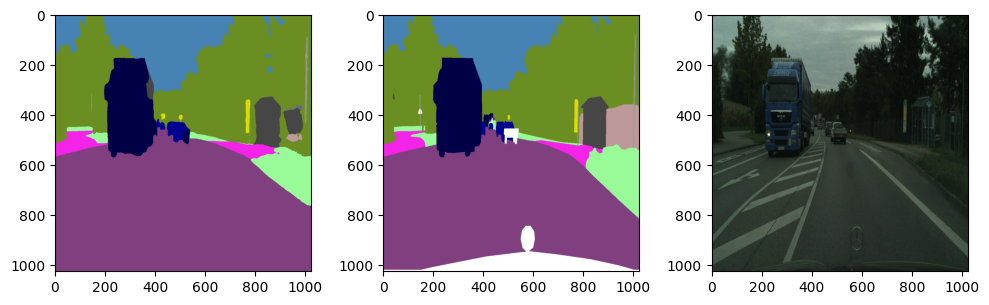

Overall:-
{'mean_accuracy': 0.8074851450406015,
 'mean_iou': 0.620136760774226,
 'overall_accuracy': 0.9510310788988081,
 'per_category_accuracy': array([0.99746074, 0.91007801, 0.93833139,        nan, 0.06311697,
       0.52138214,        nan, 0.95738046, 0.97993824, 0.7785952 ,
       0.99502632,        nan,        nan, 0.80240053, 0.93862659,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.88318032, 0.79256369, 0.61345608, 0.        , 0.06311697,
       0.38976982,        nan, 0.68070953, 0.90108684, 0.74945409,
       0.93485173,        nan,        nan, 0.54033827, 0.89311377,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.20385660231113434
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.197984218597412


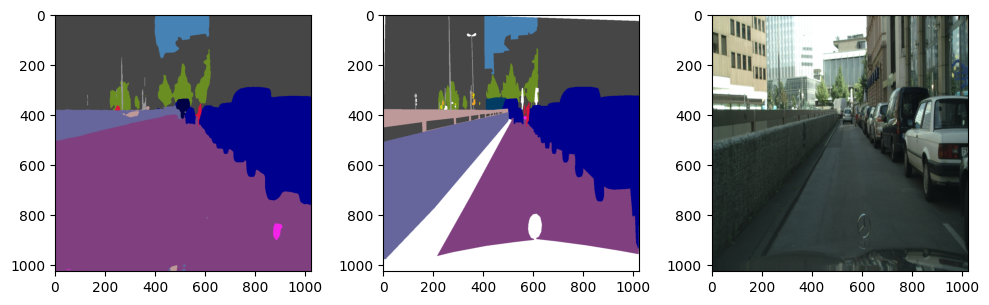

Overall:-
{'mean_accuracy': 0.44500485921683147,
 'mean_iou': 0.3306423442533309,
 'overall_accuracy': 0.7813975346459282,
 'per_category_accuracy': array([0.97145805, 0.        , 0.94463536, 0.00433909, 0.04861641,
       0.41569689, 0.        , 0.01413428, 0.93529412,        nan,
       0.88662767, 0.61510129,        nan, 0.94916002,        nan,
       0.        ,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.43102952, 0.        , 0.87493274, 0.00345553, 0.04707132,
       0.36217873, 0.        , 0.01413428, 0.78272684,        nan,
       0.78006524, 0.42251739,        nan, 0.91088122, 0.        ,
       0.        ,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 1.9336707592010498
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.057846069335938


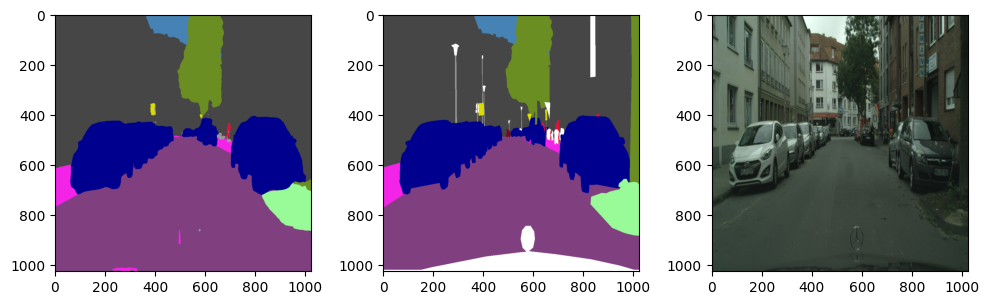

Overall:-
{'mean_accuracy': 0.6505510258183211,
 'mean_iou': 0.5908432555412775,
 'overall_accuracy': 0.9528016666971848,
 'per_category_accuracy': array([0.97718519, 0.91707839, 0.99763614,        nan,        nan,
       0.00889171,        nan, 0.51361162, 0.68708451, 0.84277317,
       0.97669632, 0.24980048,        nan, 0.98530376,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.8513758 , 0.75006735, 0.88700601,        nan,        nan,
       0.00666032,        nan, 0.5026643 , 0.66459704, 0.80192808,
       0.90652293, 0.19525889,        nan, 0.9331951 ,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.22236624360084534
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.36731791496277


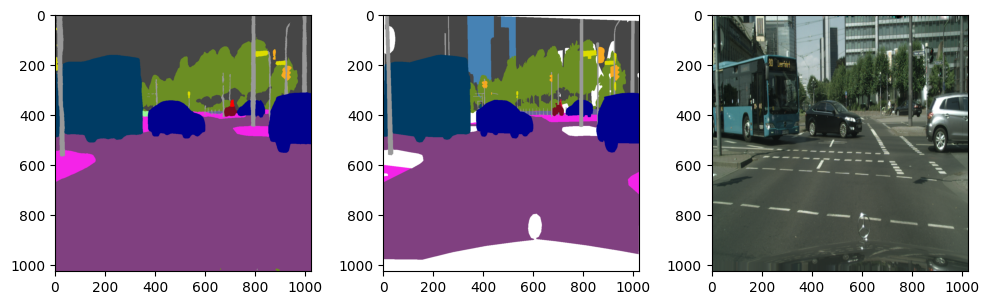

Overall:-
{'mean_accuracy': 0.5966329550968824,
 'mean_iou': 0.4378557482174073,
 'overall_accuracy': 0.9323549642065418,
 'per_category_accuracy': array([0.99360469, 0.44525111, 0.95843645, 0.2467311 ,        nan,
       0.85218179, 0.41477587, 0.67583497, 0.93151038,        nan,
       0.        , 0.        ,        nan, 0.99001233,        nan,
       0.98640621, 0.        ,        nan, 0.85811648,        nan]),
 'per_category_iou': array([0.80563546, 0.18440042, 0.68839508, 0.24111111,        nan,
       0.66752709, 0.39814077, 0.51512429, 0.85512573, 0.        ,
       0.        , 0.        , 0.        , 0.95951845,        nan,
       0.96291535, 0.        ,        nan, 0.72779821,        nan])}
 
Cross Entropy Loss: 0.4528387188911438
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 31.89668893814087


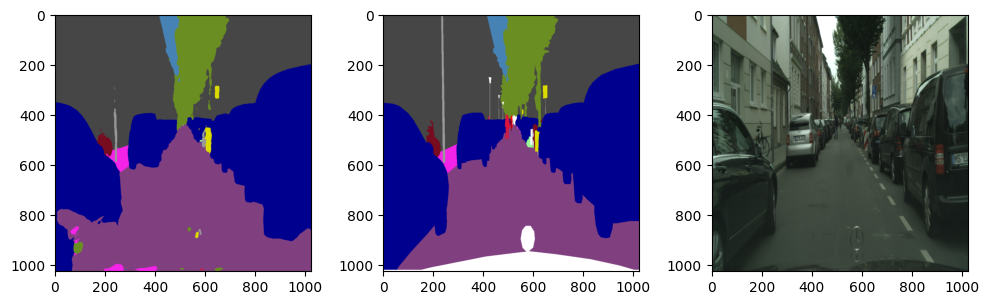

Overall:-
{'mean_accuracy': 0.6266184562340339,
 'mean_iou': 0.519211946386043,
 'overall_accuracy': 0.9455104211016968,
 'per_category_accuracy': array([0.94591896, 0.93380223, 0.99551075,        nan,        nan,
       0.3186905 ,        nan, 0.9103479 , 0.92374082, 0.07798165,
       0.89905143, 0.005     , 0.        , 0.92911464,        nan,
              nan,        nan,        nan, 0.5802626 ,        nan]),
 'per_category_iou': array([0.76338173, 0.5109803 , 0.94454253,        nan,        nan,
       0.27264933,        nan, 0.57234997, 0.83598909, 0.07798165,
       0.86372377, 0.0047619 , 0.        , 0.87967194,        nan,
              nan,        nan,        nan, 0.50451114,        nan])}
 
Cross Entropy Loss: 0.17864753305912018
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.27603006362915


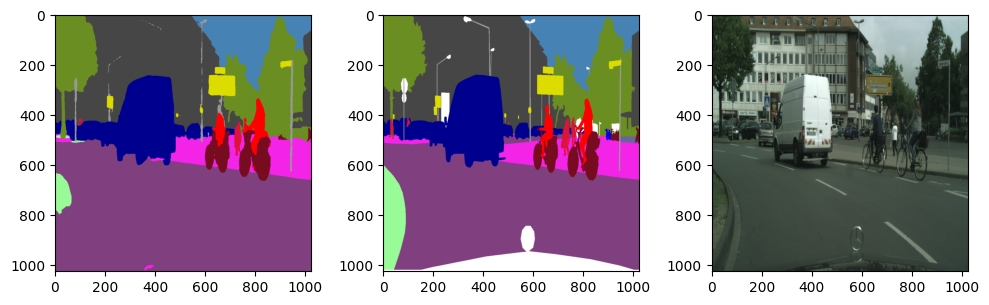

Overall:-
{'mean_accuracy': 0.6912666716979431,
 'mean_iou': 0.6097231221786128,
 'overall_accuracy': 0.9380588568482431,
 'per_category_accuracy': array([0.98805191, 0.88730109, 0.97408715, 0.        ,        nan,
       0.59577279,        nan, 0.91525156, 0.97117786, 0.26653724,
       0.97008182, 0.47098321, 0.8221887 , 0.94252982,        nan,
              nan,        nan, 0.        , 0.87377024,        nan]),
 'per_category_iou': array([0.83033567, 0.76472954, 0.90107873, 0.        ,        nan,
       0.362249  ,        nan, 0.86130519, 0.87989713, 0.25622948,
       0.92570205, 0.43767642, 0.66544591, 0.92284824,        nan,
              nan,        nan, 0.        , 0.72862634,        nan])}
 
Cross Entropy Loss: 0.27769362926483154
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.096722841262817


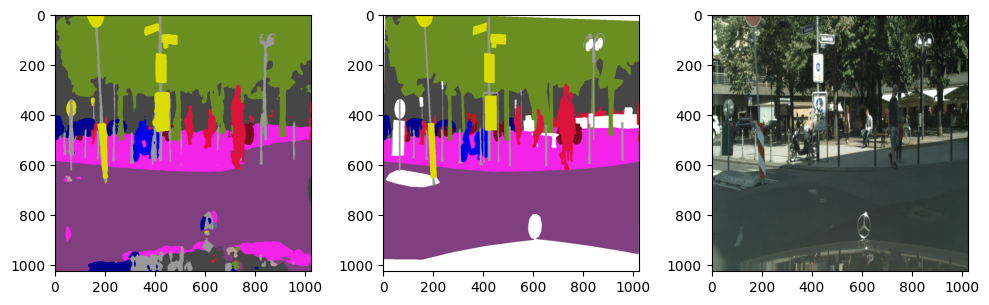

Overall:-
{'mean_accuracy': 0.7253258130099367,
 'mean_iou': 0.4506325084317656,
 'overall_accuracy': 0.9031335834096303,
 'per_category_accuracy': array([0.97695904, 0.70289326, 0.86144011,        nan,        nan,
       0.73195369,        nan, 0.96867322, 0.95830791,        nan,
              nan, 0.73351311, 0.        , 0.80569363,        nan,
              nan,        nan, 0.8203352 , 0.41881478,        nan]),
 'per_category_iou': array([0.82539378, 0.52788708, 0.55077231, 0.        , 0.        ,
       0.34346429,        nan, 0.76424787, 0.86590001,        nan,
              nan, 0.63656022, 0.        , 0.33190618,        nan,
              nan,        nan, 0.64979202, 0.36229885,        nan])}
 
Cross Entropy Loss: 0.3706536293029785
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.12966012954712


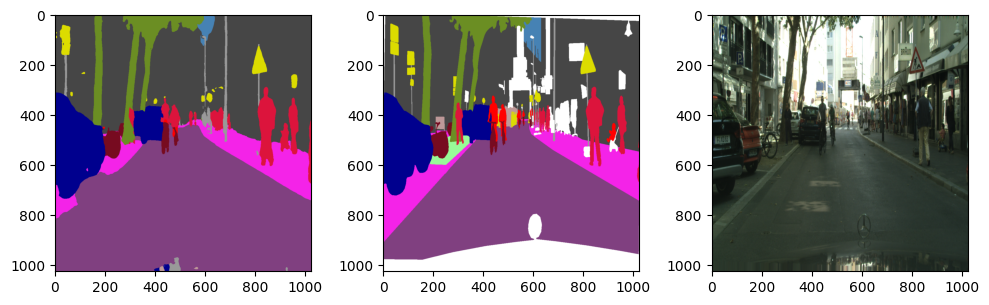

Overall:-
{'mean_accuracy': 0.619588653016443,
 'mean_iou': 0.493085109181671,
 'overall_accuracy': 0.9129004202694437,
 'per_category_accuracy': array([0.99142418, 0.6721949 , 0.96649533,        nan, 0.        ,
       0.69509698,        nan, 0.57730033, 0.97171453, 0.        ,
       0.44907296, 0.86159129, 0.04499697, 0.98615743,        nan,
              nan,        nan,        nan, 0.83860759,        nan]),
 'per_category_iou': array([0.73359918, 0.58567999, 0.784044  ,        nan, 0.        ,
       0.36078284,        nan, 0.49547589, 0.82531   , 0.        ,
       0.40980004, 0.53492885, 0.04352417, 0.90603899,        nan,
              nan,        nan,        nan, 0.73092246,        nan])}
 
Cross Entropy Loss: 0.4574020206928253
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.719363927841187


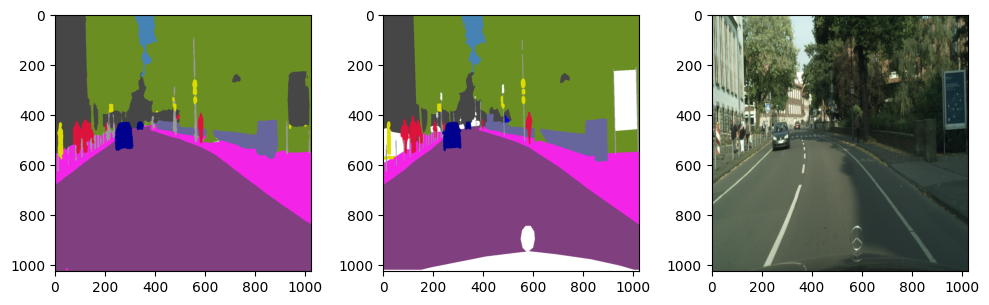

Overall:-
{'mean_accuracy': 0.789913514650323,
 'mean_iou': 0.6313211606937278,
 'overall_accuracy': 0.9707208188831261,
 'per_category_accuracy': array([0.99716639, 0.95999698, 0.94460989, 0.77814116,        nan,
       0.55606024,        nan, 0.83315998, 0.98918346,        nan,
       0.85861114, 0.79754542,        nan, 0.97457401,        nan,
              nan,        nan, 0.        ,        nan,        nan]),
 'per_category_iou': array([0.88633603, 0.87281328, 0.70702165, 0.77353934,        nan,
       0.32167058,        nan, 0.65441176, 0.93488924, 0.        ,
       0.81010203, 0.70005938,        nan, 0.91501062,        nan,
              nan,        nan, 0.        ,        nan,        nan])}
 
Cross Entropy Loss: 0.08949002623558044
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.682008981704712


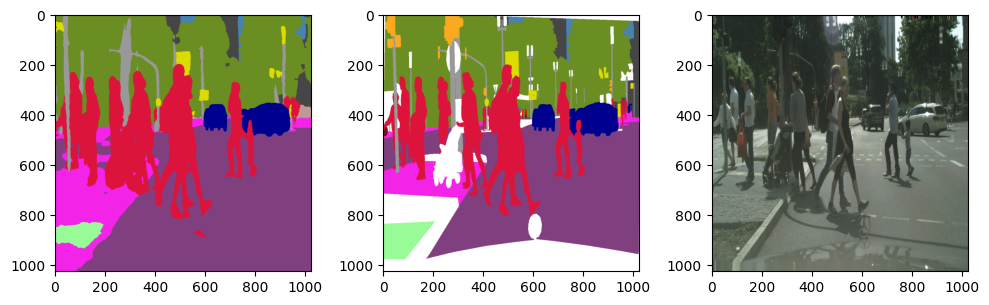

Overall:-
{'mean_accuracy': 0.5814694912984145,
 'mean_iou': 0.4061923613287789,
 'overall_accuracy': 0.8937119646865497,
 'per_category_accuracy': array([9.41879383e-01, 7.60117448e-01, 6.06115364e-01, 0.00000000e+00,
                  nan, 6.66701270e-01, 6.40153637e-04, 8.13391039e-01,
       9.22248011e-01, 6.50758805e-01, 8.44729345e-01, 9.78967776e-01,
       0.00000000e+00, 9.55024283e-01,            nan,            nan,
                  nan,            nan, 0.00000000e+00,            nan]),
 'per_category_iou': array([7.00366056e-01, 2.87012729e-01, 4.23539576e-01, 0.00000000e+00,
       0.00000000e+00, 3.91136645e-01, 6.39335092e-04, 5.49393861e-01,
       7.99068393e-01, 6.29518489e-01, 6.58066306e-01, 7.27177924e-01,
       0.00000000e+00, 9.26966106e-01,            nan,            nan,
                  nan,            nan, 0.00000000e+00,            nan])}
 
Cross Entropy Loss: 0.3979511260986328
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 29.84129285812378


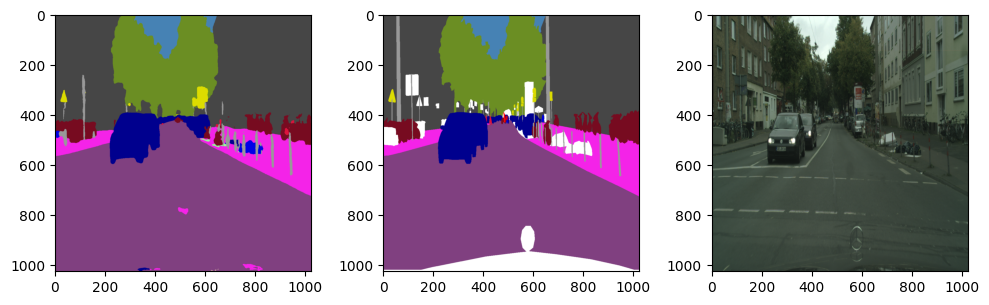

Overall:-
{'mean_accuracy': 0.6272706106174178,
 'mean_iou': 0.4613059032254694,
 'overall_accuracy': 0.9591131097680909,
 'per_category_accuracy': array([0.99620504, 0.92104147, 0.98573142,        nan,        nan,
       0.2577905 ,        nan, 0.6187456 , 0.98062776,        nan,
       0.95928877, 0.07532468, 0.        , 0.95885703,        nan,
              nan,        nan, 0.        , 0.77363507,        nan]),
 'per_category_iou': array([0.89522348, 0.8170471 , 0.86234761,        nan, 0.        ,
       0.18845204,        nan, 0.29418663, 0.93638074, 0.        ,
       0.89259561, 0.02472293, 0.        , 0.88669528,        nan,
              nan,        nan, 0.        , 0.66063123,        nan])}
 
Cross Entropy Loss: 0.21156303584575653
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.945507049560547


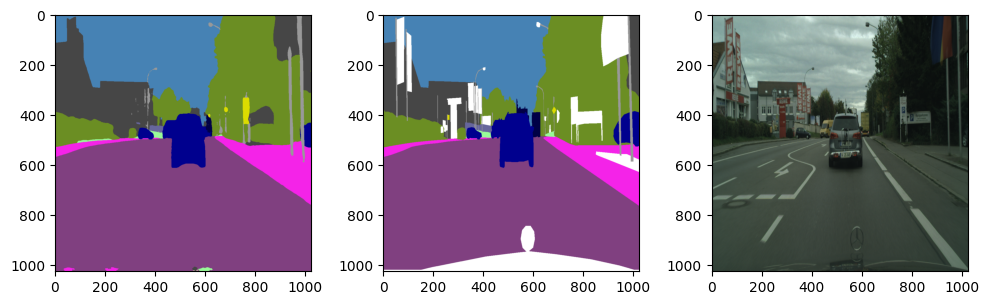

Overall:-
{'mean_accuracy': 0.7443936774072673,
 'mean_iou': 0.5295478417465703,
 'overall_accuracy': 0.9620572155308168,
 'per_category_accuracy': array([0.99479706, 0.9625086 , 0.97929337, 0.52963272,        nan,
       0.5300006 ,        nan, 0.49655172, 0.95126477, 0.61755075,
       0.99000963,        nan,        nan, 0.80689833, 0.32982288,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.8935792 , 0.78691813, 0.53830541, 0.50377134, 0.        ,
       0.34915779,        nan, 0.06735267, 0.87358473, 0.29804046,
       0.96231648,        nan,        nan, 0.75211926, 0.32942864,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.1374736875295639
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.789674043655396


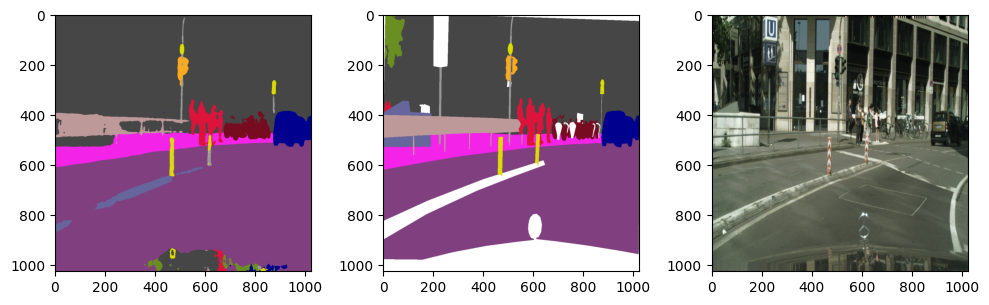

Overall:-
{'mean_accuracy': 0.6790538980711153,
 'mean_iou': 0.5163241794250694,
 'overall_accuracy': 0.9348768794577692,
 'per_category_accuracy': array([0.99913392, 0.87784996, 0.98845146, 0.        , 0.64851849,
       0.35544722, 0.87534435, 0.70955581, 0.        ,        nan,
              nan, 0.80830347,        nan, 0.98337333,        nan,
              nan,        nan,        nan, 0.90266876,        nan]),
 'per_category_iou': array([0.80139606, 0.82062986, 0.7911026 , 0.        , 0.62344055,
       0.24793022, 0.70474078, 0.59034502, 0.        ,        nan,
              nan, 0.65818742,        nan, 0.85981915,        nan,
              nan,        nan, 0.        , 0.61462268,        nan])}
 
Cross Entropy Loss: 0.3624005913734436
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.777992010116577


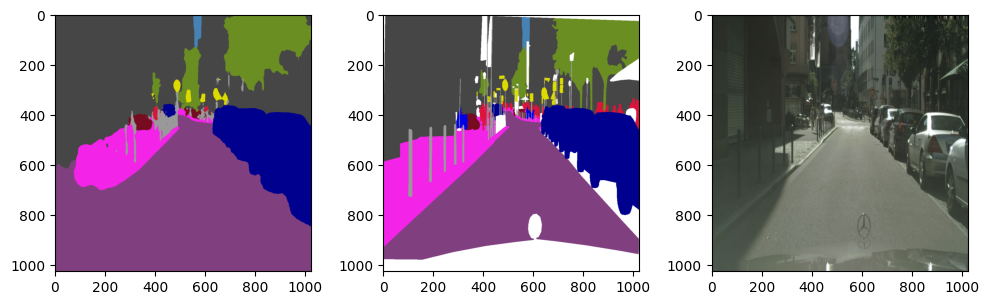

Overall:-
{'mean_accuracy': 0.6339077826046254,
 'mean_iou': 0.5052209965962823,
 'overall_accuracy': 0.8897657736053238,
 'per_category_accuracy': array([0.9950408 , 0.5279724 , 0.96478082,        nan,        nan,
       0.22594084,        nan, 0.51406178, 0.88474614,        nan,
       0.85319516, 0.10744798,        nan, 0.99612242,        nan,
              nan,        nan, 0.        , 0.90367728,        nan]),
 'per_category_iou': array([0.66449819, 0.4793551 , 0.80291   ,        nan,        nan,
       0.16101271,        nan, 0.43679812, 0.72696225,        nan,
       0.74791824, 0.10578921,        nan, 0.88824924,        nan,
              nan,        nan, 0.        , 0.54393789,        nan])}
 
Cross Entropy Loss: 0.564370334148407
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.4858660697937


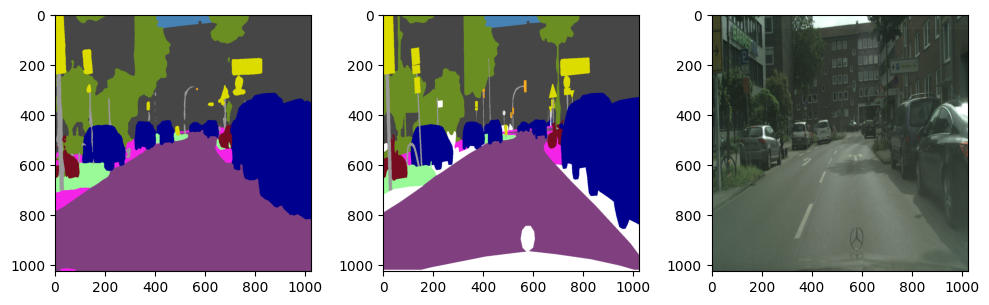

Overall:-
{'mean_accuracy': 0.8002916236831809,
 'mean_iou': 0.6675796928308336,
 'overall_accuracy': 0.9530524126785942,
 'per_category_accuracy': array([0.99487095, 0.64808698, 0.95323081,        nan,        nan,
       0.68960643, 0.06003752, 0.87859377, 0.90960621, 0.95068118,
       0.98615712,        nan,        nan, 0.96349182,        nan,
              nan,        nan,        nan, 0.76884508,        nan]),
 'per_category_iou': array([0.83249065, 0.26805943, 0.88616583,        nan,        nan,
       0.48445095, 0.06003752, 0.78205601, 0.80997488, 0.74016355,
       0.86525485,        nan,        nan, 0.90191173,        nan,
              nan,        nan,        nan, 0.71281122,        nan])}
 
Cross Entropy Loss: 0.14008983969688416
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.4600510597229


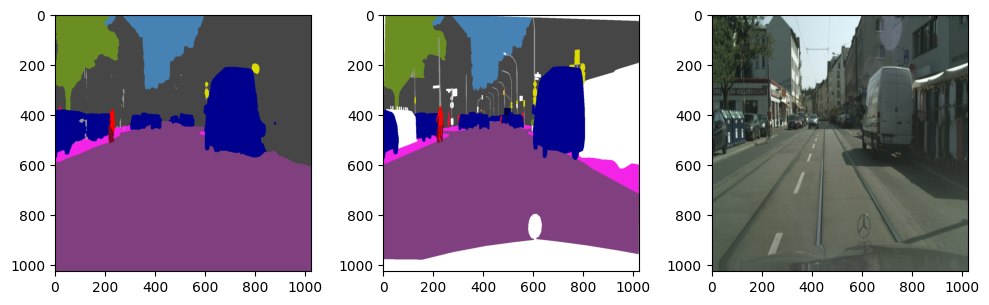

Overall:-
{'mean_accuracy': 0.5258510829803575,
 'mean_iou': 0.4377022986963326,
 'overall_accuracy': 0.9521906625783482,
 'per_category_accuracy': array([0.99733206, 0.30615159, 0.98981318,        nan,        nan,
       0.05471355, 0.        , 0.3107275 , 0.94383629,        nan,
       0.98142549, 0.        , 0.65677492, 0.96261952, 0.        ,
              nan,        nan,        nan, 0.63266998,        nan]),
 'per_category_iou': array([0.77044568, 0.28421518, 0.66004212,        nan,        nan,
       0.04591123, 0.        , 0.27937916, 0.8874277 ,        nan,
       0.92257825, 0.        , 0.59093199, 0.81788146, 0.        ,
              nan,        nan,        nan, 0.43131713,        nan])}
 
Cross Entropy Loss: 0.26293760538101196
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.213279962539673


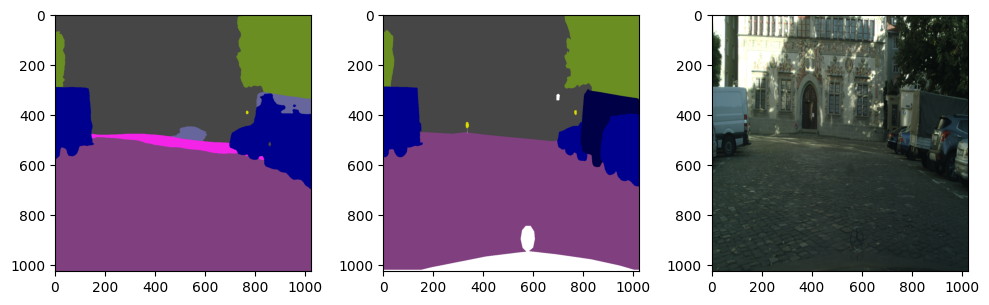

Overall:-
{'mean_accuracy': 0.5911395018302458,
 'mean_iou': 0.41495127879646376,
 'overall_accuracy': 0.9330446815608563,
 'per_category_accuracy': array([0.95061688,        nan, 0.98263881,        nan,        nan,
       0.        ,        nan, 0.24824356, 0.97970015,        nan,
              nan,        nan,        nan, 0.97466226, 0.00211485,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.8577378 , 0.        , 0.95307004, 0.        ,        nan,
       0.        ,        nan, 0.24145786, 0.93441218,        nan,
              nan,        nan,        nan, 0.74576879, 0.00211485,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.41393789649009705
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.705613136291504


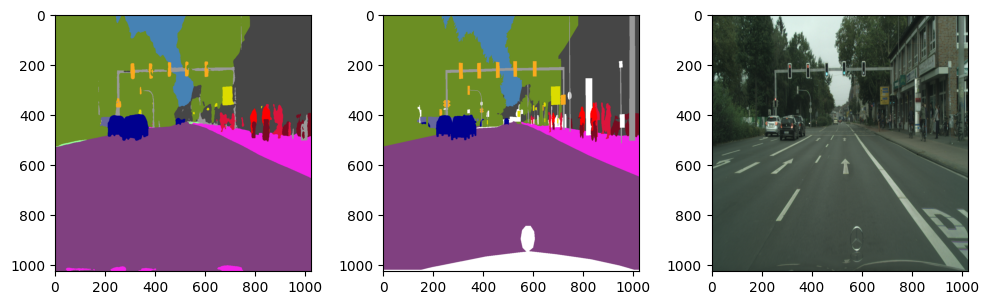

Overall:-
{'mean_accuracy': 0.7676480855008113,
 'mean_iou': 0.6159912174209989,
 'overall_accuracy': 0.9544658154721439,
 'per_category_accuracy': array([0.99519667, 0.96271206, 0.95349418, 0.48183391,        nan,
       0.31702459, 0.60293902, 0.79880817, 0.97760385,        nan,
       0.89745848, 0.70187123, 0.60705813, 0.96196364,        nan,
              nan,        nan,        nan, 0.72146119,        nan]),
 'per_category_iou': array([0.9095404 , 0.82363737, 0.75409709, 0.47163421,        nan,
       0.26720677, 0.55341246, 0.66344568, 0.91780559, 0.        ,
       0.86571838, 0.48161045, 0.47122468, 0.87793708,        nan,
              nan,        nan,        nan, 0.5666069 ,        nan])}
 
Cross Entropy Loss: 0.13459573686122894
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 31.77465009689331


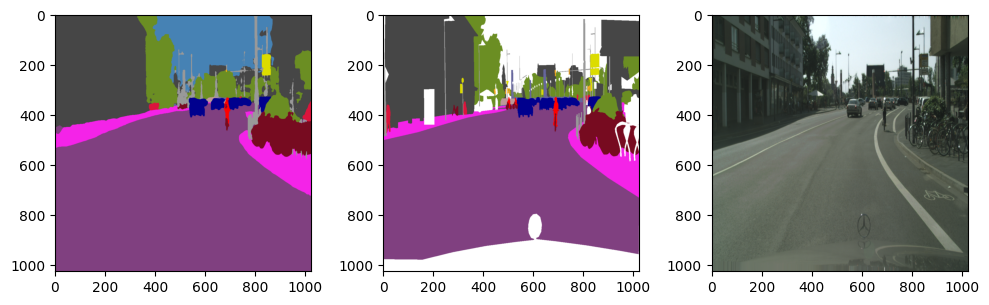

Overall:-
{'mean_accuracy': 0.5563146339497567,
 'mean_iou': 0.41889190367399837,
 'overall_accuracy': 0.9385407001472071,
 'per_category_accuracy': array([0.97578103, 0.9054806 , 0.95519405, 0.03377309, 0.        ,
       0.49224352, 0.00858896, 0.64686959, 0.92146097,        nan,
              nan, 0.        , 0.50426894, 0.90028253,        nan,
              nan,        nan,        nan, 0.88814697,        nan]),
 'per_category_iou': array([0.80582465, 0.70056142, 0.78804698, 0.03298969, 0.        ,
       0.24954557, 0.00826446, 0.60537286, 0.70396941,        nan,
       0.        , 0.        , 0.41629956, 0.8293019 ,        nan,
              nan,        nan,        nan, 0.72431014,        nan])}
 
Cross Entropy Loss: 0.276169091463089
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.326088905334473


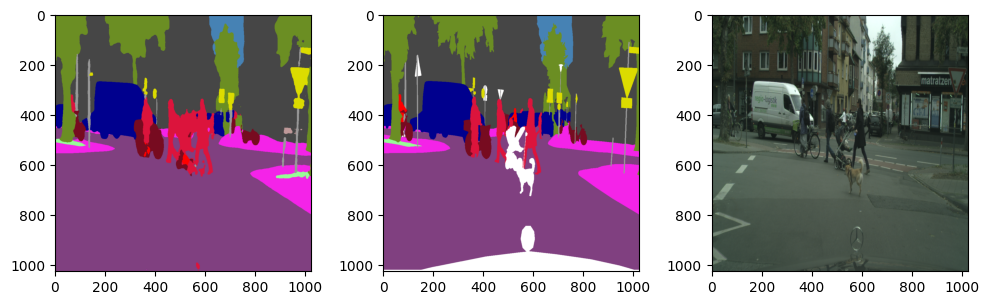

Overall:-
{'mean_accuracy': 0.7890786222466928,
 'mean_iou': 0.5894539151380351,
 'overall_accuracy': 0.9421303294876539,
 'per_category_accuracy': array([0.98890559, 0.83455018, 0.949102  ,        nan,        nan,
       0.71746531,        nan, 0.91314653, 0.93806671, 0.71260684,
       0.8540968 , 0.89308996, 0.        , 0.84630942,        nan,
              nan,        nan,        nan, 0.82160412,        nan]),
 'per_category_iou': array([0.86855451, 0.78610128, 0.89731422,        nan, 0.        ,
       0.4337502 ,        nan, 0.79885951, 0.8153526 , 0.31373471,
       0.81304584, 0.51966327, 0.        , 0.83021684,        nan,
              nan,        nan,        nan, 0.58630793,        nan])}
 
Cross Entropy Loss: 0.17412178218364716
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.849790811538696


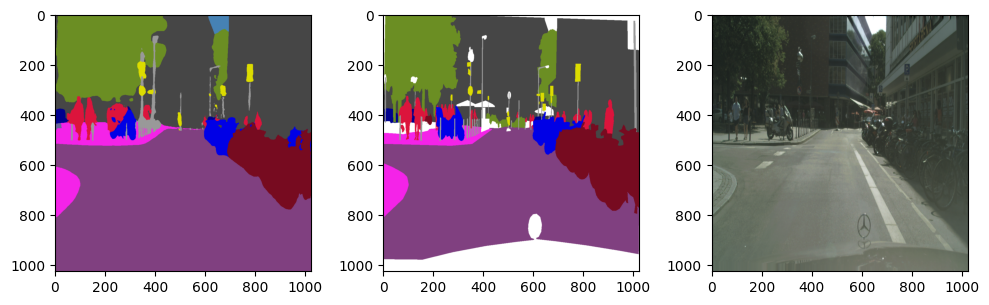

Overall:-
{'mean_accuracy': 0.776145780303356,
 'mean_iou': 0.5063428537292723,
 'overall_accuracy': 0.8952112071420123,
 'per_category_accuracy': array([0.99149759, 0.93764822, 0.82914399,        nan,        nan,
       0.44315073,        nan, 0.73816208, 0.8939569 ,        nan,
              nan, 0.59478435,        nan, 0.67063222,        nan,
              nan,        nan, 0.77648044, 0.88600128,        nan]),
 'per_category_iou': array([0.7750748 , 0.73472706, 0.69379712, 0.        ,        nan,
       0.27898967,        nan, 0.48327411, 0.66193983,        nan,
       0.        , 0.44136098,        nan, 0.49747857,        nan,
              nan,        nan, 0.63853805, 0.87093406,        nan])}
 
Cross Entropy Loss: 0.4586656391620636
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.12316107749939


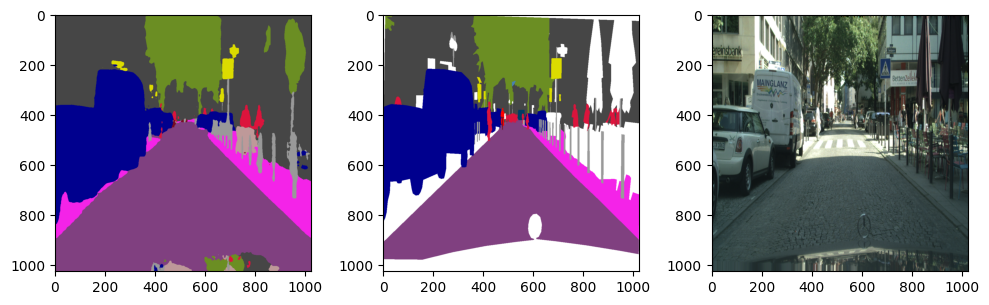

Overall:-
{'mean_accuracy': 0.5454909972186007,
 'mean_iou': 0.37204884480406225,
 'overall_accuracy': 0.9575534687576197,
 'per_category_accuracy': array([0.99654396, 0.94899544, 0.96685005,        nan, 0.        ,
       0.71659584,        nan, 0.76928484, 0.9283645 ,        nan,
       0.        , 0.32971479, 0.        , 0.98370611,        nan,
       0.        ,        nan,        nan, 0.45132743,        nan]),
 'per_category_iou': array([0.77568701, 0.57343102, 0.65922913,        nan, 0.        ,
       0.41763968,        nan, 0.4909723 , 0.67726737,        nan,
       0.        , 0.23867695, 0.        , 0.83948031,        nan,
       0.        ,        nan,        nan, 0.16425121,        nan])}
 
Cross Entropy Loss: 0.16999489068984985
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.76919388771057


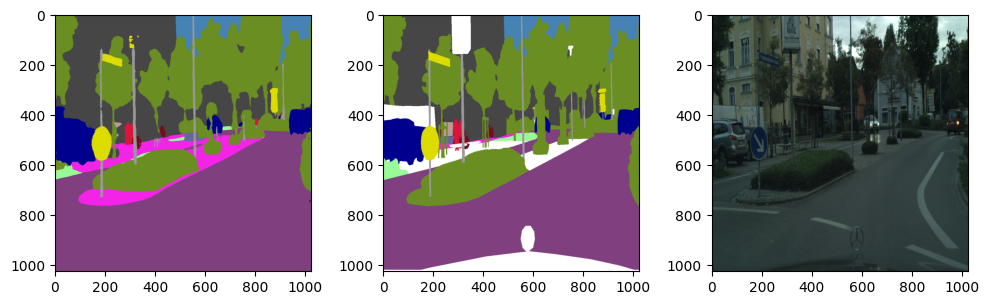

Overall:-
{'mean_accuracy': 0.7080447068581819,
 'mean_iou': 0.5483114284100209,
 'overall_accuracy': 0.9231062238323997,
 'per_category_accuracy': array([0.98449173, 0.8114254 , 0.97361992, 0.        , 0.15919428,
       0.76073969,        nan, 0.94815899, 0.86313508, 0.43365658,
       0.95067461, 0.76361032,        nan, 0.94509342,        nan,
              nan,        nan,        nan, 0.61078118,        nan]),
 'per_category_iou': array([0.85938337, 0.02889078, 0.7194576 , 0.        , 0.13904654,
       0.52963605,        nan, 0.83501798, 0.83126164, 0.37909645,
       0.87193334, 0.59074536,        nan, 0.81133424,        nan,
              nan,        nan,        nan, 0.53224522,        nan])}
 
Cross Entropy Loss: 0.4362161457538605
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.049557209014893


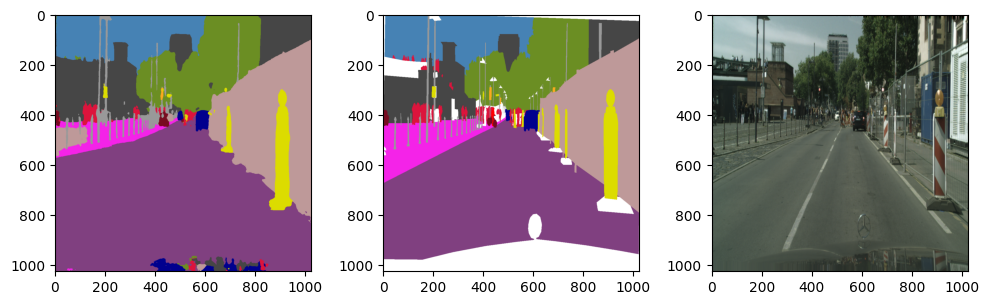

Overall:-
{'mean_accuracy': 0.7188021600456387,
 'mean_iou': 0.5559633881256345,
 'overall_accuracy': 0.9288559650086353,
 'per_category_accuracy': array([0.98611434, 0.46011388, 0.9661762 ,        nan, 0.99230956,
       0.71761871, 0.41242236, 0.81779421, 0.96915225,        nan,
       0.96594445, 0.37503645, 0.        , 0.84534861,        nan,
              nan,        nan,        nan, 0.83639706,        nan]),
 'per_category_iou': array([0.77128362, 0.44565115, 0.71376771,        nan, 0.8460941 ,
       0.4264883 , 0.37813212, 0.68110193, 0.87750317,        nan,
       0.90952818, 0.2974614 , 0.        , 0.32120075,        nan,
              nan,        nan,        nan, 0.55931162,        nan])}
 
Cross Entropy Loss: 0.3372385501861572
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.0921151638031


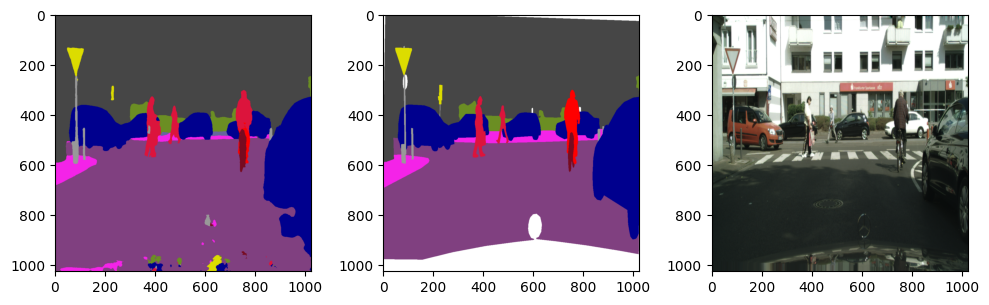

Overall:-
{'mean_accuracy': 0.8302411376317691,
 'mean_iou': 0.5163405784451132,
 'overall_accuracy': 0.9558696556940844,
 'per_category_accuracy': array([0.9592691 , 0.60610887, 0.99487221,        nan,        nan,
       0.86351914,        nan, 0.88969436, 0.92655229,        nan,
              nan, 0.93978736, 0.1884345 , 0.96724041,        nan,
              nan,        nan,        nan, 0.96693314,        nan]),
 'per_category_iou': array([0.7651892 , 0.50476093, 0.94674552, 0.        , 0.        ,
       0.54665327,        nan, 0.62290809, 0.72862191,        nan,
              nan, 0.44103819, 0.18529698, 0.84539048,        nan,
              nan,        nan,        nan, 0.60948236,        nan])}
 
Cross Entropy Loss: 0.15763220191001892
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.587979078292847


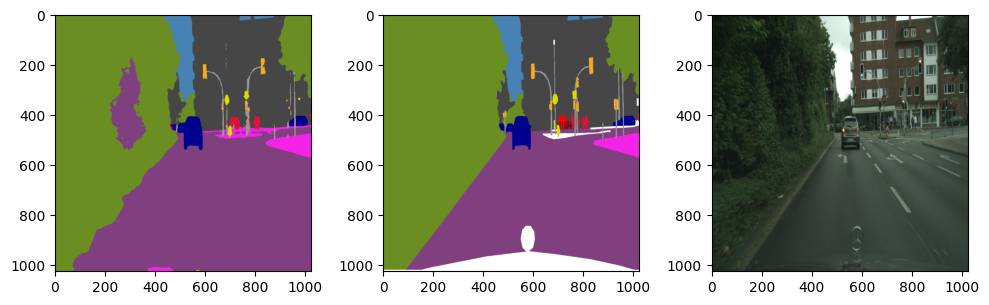

Overall:-
{'mean_accuracy': 0.6833274406605288,
 'mean_iou': 0.567599497286387,
 'overall_accuracy': 0.9399136459280532,
 'per_category_accuracy': array([0.98748055, 0.98833128, 0.97982692,        nan,        nan,
       0.57628239, 0.5324291 , 0.76824255, 0.90073098,        nan,
       0.94892123, 0.57217227, 0.        , 0.94551202,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.791733  , 0.55069246, 0.91615433,        nan,        nan,
       0.43914971, 0.50104433, 0.6677088 , 0.8827297 ,        nan,
       0.89196203, 0.28267477, 0.        , 0.88734484,        nan,
              nan,        nan,        nan, 0.        ,        nan])}
 
Cross Entropy Loss: 0.14924760162830353
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.772102117538452


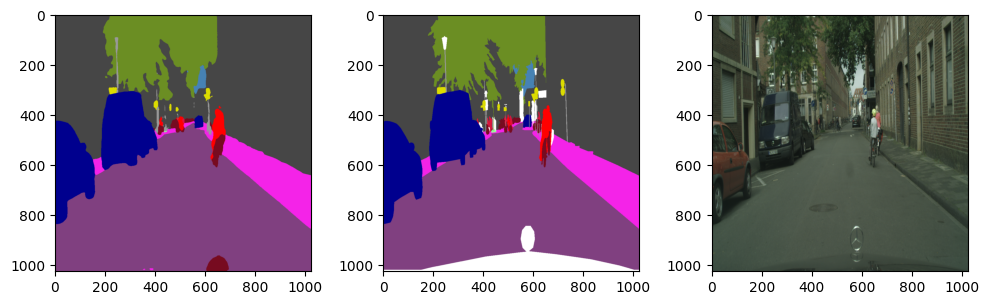

Overall:-
{'mean_accuracy': 0.711182404605815,
 'mean_iou': 0.616548395409664,
 'overall_accuracy': 0.9740338446233339,
 'per_category_accuracy': array([0.98940242, 0.96619267, 0.98457511,        nan,        nan,
       0.45583039,        nan, 0.60310881, 0.95697789, 0.25      ,
       0.67613504, 0.10367526, 0.82825532, 0.99148021,        nan,
              nan,        nan,        nan, 0.72855575,        nan]),
 'per_category_iou': array([0.88291291, 0.92303594, 0.93102326,        nan,        nan,
       0.23689482,        nan, 0.56669912, 0.89422455, 0.25      ,
       0.6621067 , 0.1023281 , 0.63866649, 0.94353221,        nan,
              nan,        nan,        nan, 0.36715663,        nan])}
 
Cross Entropy Loss: 0.08839871734380722
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 32.388176918029785


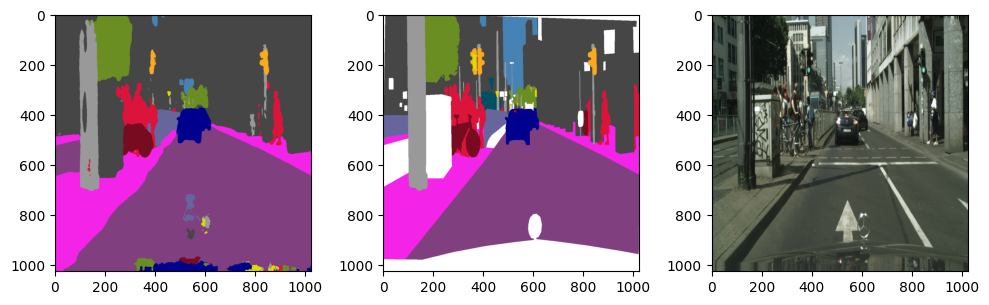

Overall:-
{'mean_accuracy': 0.6019842702364286,
 'mean_iou': 0.44461351031729673,
 'overall_accuracy': 0.8998751643783968,
 'per_category_accuracy': array([0.97206008, 0.93779838, 0.98703485, 0.49161976,        nan,
       0.73329636, 0.63023592, 0.13449477, 0.9694783 ,        nan,
       0.11302211, 0.70092949, 0.        , 0.9620798 ,        nan,
              nan, 0.        ,        nan, 0.79572995,        nan]),
 'per_category_iou': array([0.75185479, 0.82121991, 0.66641431, 0.37490462, 0.        ,
       0.68818307, 0.60480517, 0.05308031, 0.81225833,        nan,
       0.1115173 , 0.61609759, 0.        , 0.52668786,        nan,
              nan, 0.        ,        nan, 0.64217941,        nan])}
 
Cross Entropy Loss: 0.5009260773658752
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.161164045333862


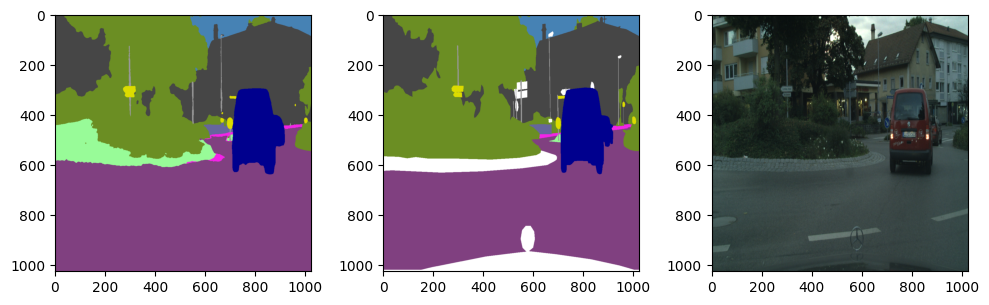

Overall:-
{'mean_accuracy': 0.814624296412972,
 'mean_iou': 0.6463614620113284,
 'overall_accuracy': 0.9405779542281716,
 'per_category_accuracy': array([0.99528542, 0.69644573, 0.97867047, 0.92725881,        nan,
       0.40961263,        nan, 0.87443182, 0.84160642, 0.4495114 ,
       0.98751011,        nan,        nan, 0.98591017,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.84665777, 0.37103378, 0.89652268, 0.6832158 ,        nan,
       0.27912661,        nan, 0.74545895, 0.82194835, 0.00566212,
       0.86139906,        nan,        nan, 0.95258951,        nan,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.19215847551822662
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 26.461708068847656


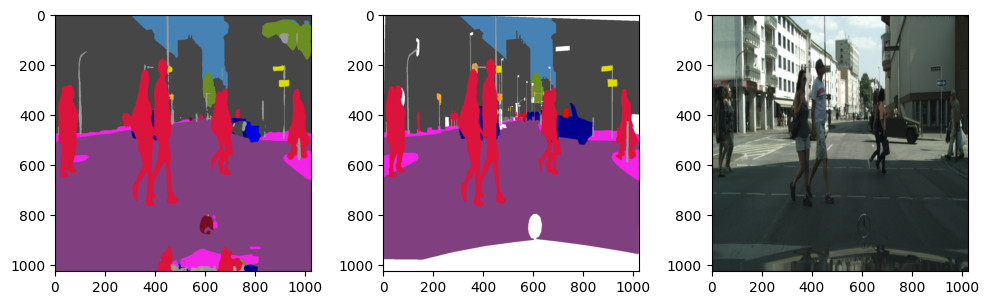

Overall:-
{'mean_accuracy': 0.5808128500054849,
 'mean_iou': 0.3720863253228778,
 'overall_accuracy': 0.9305873724139491,
 'per_category_accuracy': array([0.98851254, 0.66498932, 0.92610587,        nan,        nan,
       0.48410162, 0.13669502, 0.78512397, 0.91452796,        nan,
       0.97926597, 0.95768806, 0.        , 0.13274388,        nan,
              nan,        nan,        nan, 0.        ,        nan]),
 'per_category_iou': array([0.83764593, 0.38944647, 0.83006734,        nan, 0.        ,
       0.28522575, 0.13119534, 0.74430199, 0.18155764,        nan,
       0.88483081, 0.80375778, 0.        , 0.12117951,        nan,
              nan,        nan, 0.        , 0.        ,        nan])}
 
Cross Entropy Loss: 0.27712205052375793
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 29.07440686225891


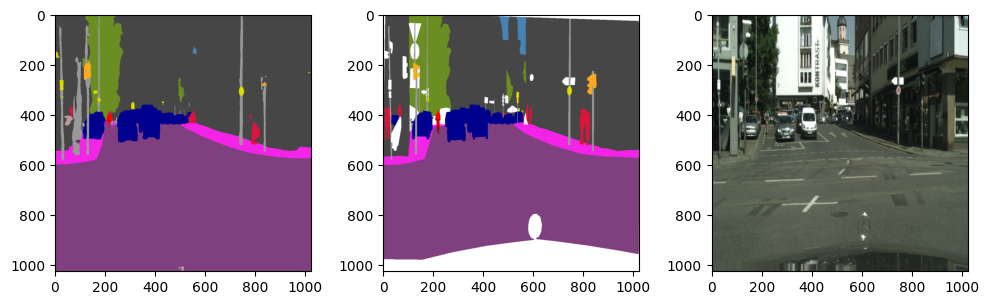

Overall:-
{'mean_accuracy': 0.597320343716746,
 'mean_iou': 0.43704376410522755,
 'overall_accuracy': 0.9444645868097115,
 'per_category_accuracy': array([0.99412443, 0.91490078, 0.95528806,        nan,        nan,
       0.8638626 , 0.39187538, 0.4840556 , 0.83014486,        nan,
       0.04992042, 0.22624015, 0.48067633, 0.90890891,        nan,
              nan,        nan,        nan, 0.06784661,        nan]),
 'per_category_iou': array([0.805575  , 0.78775309, 0.8285082 ,        nan, 0.        ,
       0.39511992, 0.3305849 , 0.19925951, 0.78105961,        nan,
       0.04992042, 0.1806571 , 0.40820513, 0.8551858 ,        nan,
              nan,        nan,        nan, 0.05974026,        nan])}
 
Cross Entropy Loss: 0.20211666822433472
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.90734887123108


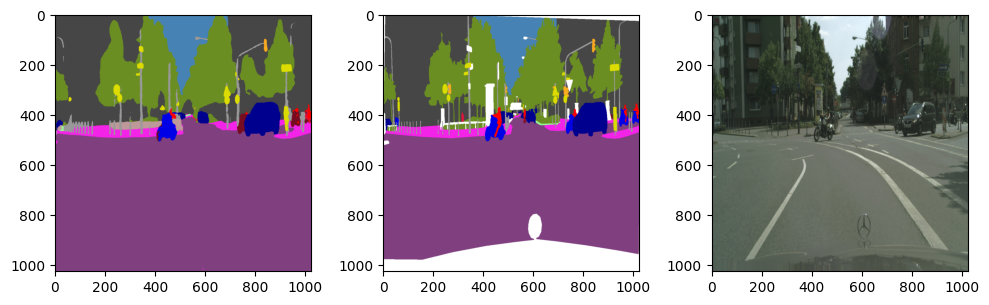

Overall:-
{'mean_accuracy': 0.5331847098124338,
 'mean_iou': 0.4170312303828451,
 'overall_accuracy': 0.9365671155233716,
 'per_category_accuracy': array([0.99389713, 0.83567308, 0.90123805,        nan,        nan,
       0.67058173, 0.25541339, 0.83637808, 0.91428825, 0.        ,
       0.91806291, 0.        , 0.29411765, 0.90364192, 0.        ,
              nan,        nan, 0.47447847, 0.        ,        nan]),
 'per_category_iou': array([0.8212731 , 0.7125136 , 0.76857016,        nan, 0.        ,
       0.39960476, 0.24354763, 0.57459347, 0.79921005, 0.        ,
       0.84759108, 0.        , 0.24783147, 0.8495933 , 0.        ,
              nan,        nan, 0.40817106, 0.        ,        nan])}
 
Cross Entropy Loss: 0.2122940570116043
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.214067935943604


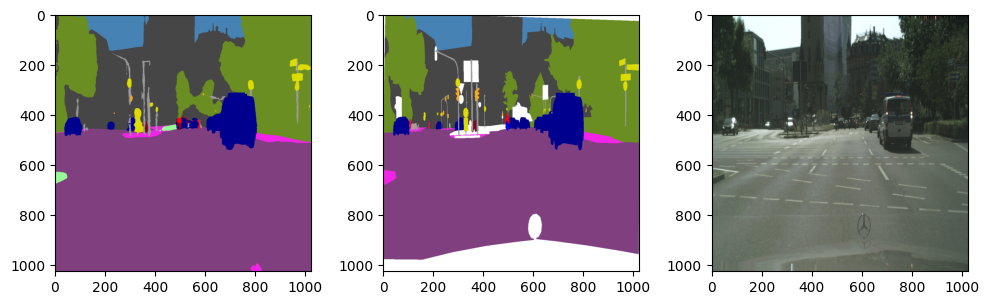

Overall:-
{'mean_accuracy': 0.576120585226952,
 'mean_iou': 0.4203036919507254,
 'overall_accuracy': 0.9561439020371464,
 'per_category_accuracy': array([0.9968618 , 0.49203843, 0.91755719,        nan, 0.        ,
       0.61683007, 0.06634304, 0.8679189 , 0.94472611,        nan,
       0.96022137, 0.        , 0.61229314, 0.95571899,        nan,
              nan,        nan, 0.        , 0.63517915,        nan]),
 'per_category_iou': array([0.81854751, 0.30692825, 0.7846962 ,        nan, 0.        ,
       0.36748601, 0.0610119 , 0.64847405, 0.84985004, 0.        ,
       0.85183819, 0.        , 0.38656716, 0.88341138,        nan,
              nan,        nan, 0.        , 0.34574468,        nan])}
 
Cross Entropy Loss: 0.14290745556354523
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.228203058242798


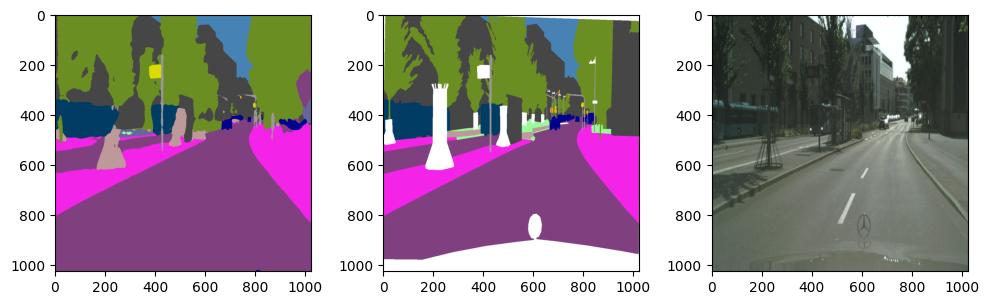

Overall:-
{'mean_accuracy': 0.6133976241082285,
 'mean_iou': 0.34410216897006046,
 'overall_accuracy': 0.8709750384974517,
 'per_category_accuracy': array([0.98771006, 0.96255001, 0.53897426,        nan, 0.25730648,
       0.53944984, 0.04369748, 0.63786008, 0.95070461, 0.00300629,
       0.99022841,        nan,        nan, 0.52902454,        nan,
       0.92025943,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.74748173, 0.85813594, 0.49125666, 0.        , 0.05021001,
       0.34590199, 0.04140127, 0.05634315, 0.67968535, 0.00287131,
       0.81289482, 0.        ,        nan, 0.32728619,        nan,
       0.74806411, 0.        ,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.4707358777523041
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.487656116485596


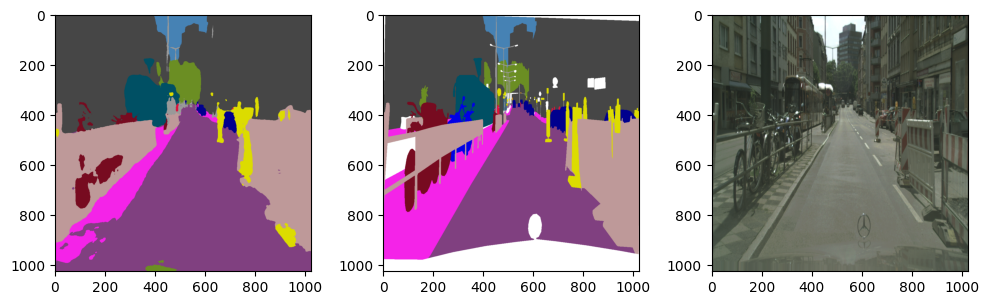

Overall:-
{'mean_accuracy': 0.5203352677796973,
 'mean_iou': 0.4019448619116875,
 'overall_accuracy': 0.8641703922321958,
 'per_category_accuracy': array([0.98845916, 0.47804806, 0.96765886,        nan, 0.9167817 ,
       0.27710122, 0.        , 0.60041771, 0.79144102,        nan,
       0.91963546, 0.01417323,        nan, 0.41276919,        nan,
       0.        , 0.96465012, 0.        , 0.47389328,        nan]),
 'per_category_iou': array([0.65503908, 0.47168615, 0.86396983,        nan, 0.64114976,
       0.14482471, 0.        , 0.39058206, 0.50205279,        nan,
       0.80958583, 0.00959488,        nan, 0.40294499,        nan,
       0.        , 0.75032026, 0.        , 0.3874226 ,        nan])}
 
Cross Entropy Loss: 0.5853264927864075
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.020249843597412


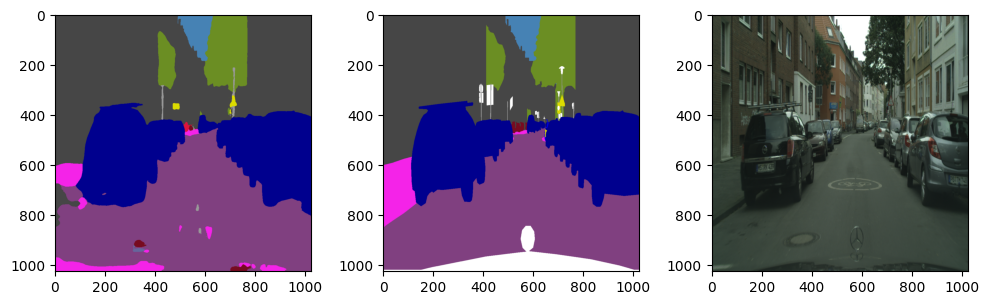

Overall:-
{'mean_accuracy': 0.6363598129503476,
 'mean_iou': 0.4436995677814452,
 'overall_accuracy': 0.9437680478786878,
 'per_category_accuracy': array([0.91976857, 0.39098308, 0.99617036,        nan,        nan,
       0.38833333,        nan, 0.65432099, 0.92159749,        nan,
       0.95812651,        nan,        nan, 0.98484128,        nan,
              nan,        nan, 0.        , 0.14945652,        nan]),
 'per_category_iou': array([0.81200668, 0.23738926, 0.92637411, 0.        ,        nan,
       0.18881686,        nan, 0.38625716, 0.89941584,        nan,
       0.91448008, 0.        ,        nan, 0.89496417,        nan,
              nan,        nan, 0.        , 0.06469066,        nan])}
 
Cross Entropy Loss: 0.1504746526479721
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 27.343172073364258


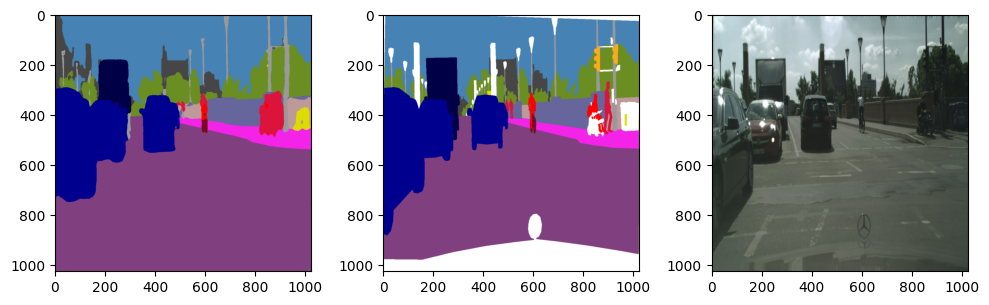

Overall:-
{'mean_accuracy': 0.7014480820422463,
 'mean_iou': 0.5103925235196441,
 'overall_accuracy': 0.9250010490444861,
 'per_category_accuracy': array([0.98095016, 0.98354982, 0.59906199, 0.76028896, 0.73397129,
       0.72124081, 0.        , 0.48335388, 0.88824481,        nan,
       0.93366069, 0.71394756, 0.21548155, 0.94380651, 0.81682933,
              nan,        nan,        nan, 0.74733388,        nan]),
 'per_category_iou': array([0.77913158, 0.88429181, 0.23496656, 0.70366442, 0.35715949,
       0.35638809, 0.        , 0.07759303, 0.72835074,        nan,
       0.85166018, 0.23029484, 0.20121029, 0.87165727, 0.79063784,
              nan,        nan,        nan, 0.58888171,        nan])}
 
Cross Entropy Loss: 0.25290343165397644
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 25.589068174362183


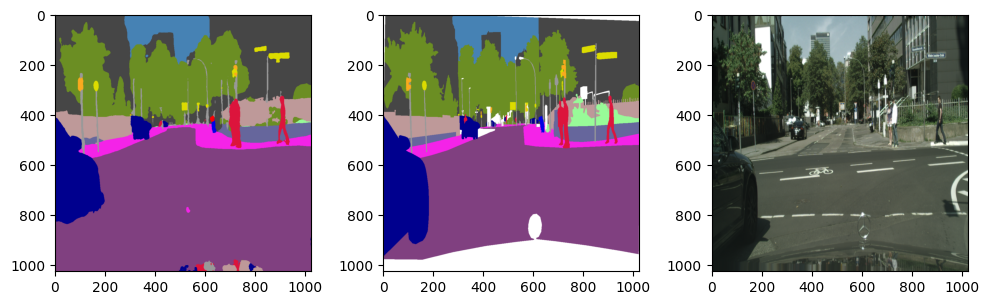

Overall:-
{'mean_accuracy': 0.7576610953329637,
 'mean_iou': 0.5814796825650391,
 'overall_accuracy': 0.9120938149200412,
 'per_category_accuracy': array([0.9878801 , 0.89510955, 0.9302382 , 0.75869645, 0.92835189,
       0.63719162, 0.57129278, 0.80324324, 0.92743723, 0.03923734,
       0.90105212, 0.88564738,        nan, 0.75802   ,        nan,
              nan,        nan, 0.58385744,        nan,        nan]),
 'per_category_iou': array([0.76252708, 0.73194014, 0.77155797, 0.68289869, 0.59852691,
       0.37466854, 0.51877428, 0.68796296, 0.84397527, 0.03872702,
       0.84128991, 0.64275598, 0.        , 0.71604969,        nan,
              nan,        nan, 0.51054079,        nan,        nan])}
 
Cross Entropy Loss: 0.41361725330352783
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 28.57292413711548


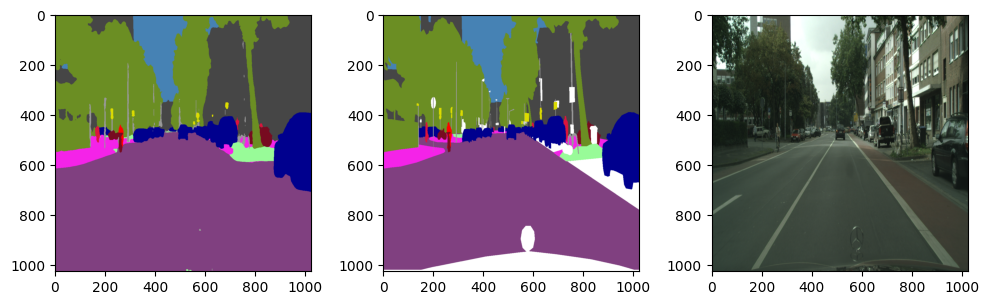

Overall:-
{'mean_accuracy': 0.7873036967665857,
 'mean_iou': 0.6545011150450707,
 'overall_accuracy': 0.9659645168387276,
 'per_category_accuracy': array([0.9908915 , 0.86142881, 0.97675808,        nan,        nan,
       0.44660194,        nan, 0.52516234, 0.96302853, 0.86375779,
       0.94832155, 0.42613065, 0.68627451, 0.95313016,        nan,
              nan,        nan,        nan, 0.80615851,        nan]),
 'per_category_iou': array([0.86003208, 0.68652576, 0.88859796,        nan,        nan,
       0.27905492,        nan, 0.48157797, 0.91020432, 0.56910569,
       0.9095338 , 0.33438486, 0.59210526, 0.86652984,        nan,
              nan,        nan,        nan, 0.47636092,        nan])}
 
Cross Entropy Loss: 0.10443230718374252
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 30.28059697151184


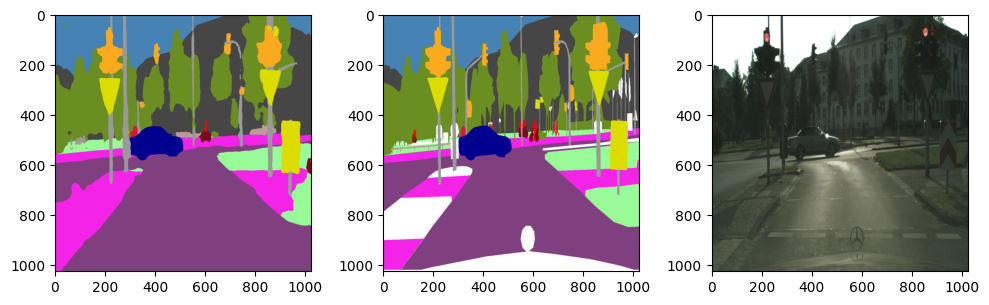

Overall:-
{'mean_accuracy': 0.6837000897942485,
 'mean_iou': 0.5271512463912033,
 'overall_accuracy': 0.886711675501984,
 'per_category_accuracy': array([0.97282311, 0.79721059, 0.9486596 ,        nan, 0.06666667,
       0.7008184 , 0.73815728, 0.9439348 , 0.8509502 , 0.64859948,
       0.96531933, 0.44497283, 0.13081761, 0.97181634,        nan,
              nan,        nan,        nan, 0.39105505,        nan]),
 'per_category_iou': array([0.79898736, 0.42841065, 0.70594382, 0.        , 0.01999292,
       0.49730526, 0.70298066, 0.78365749, 0.78802051, 0.5863796 ,
       0.91243493, 0.36818437, 0.12192263, 0.95469807,        nan,
              nan,        nan,        nan, 0.23835042,        nan])}
 
Cross Entropy Loss: 0.4394943416118622
 
torch.Size([1, 19, 1024, 1024])
Execution Time: 32.05563282966614


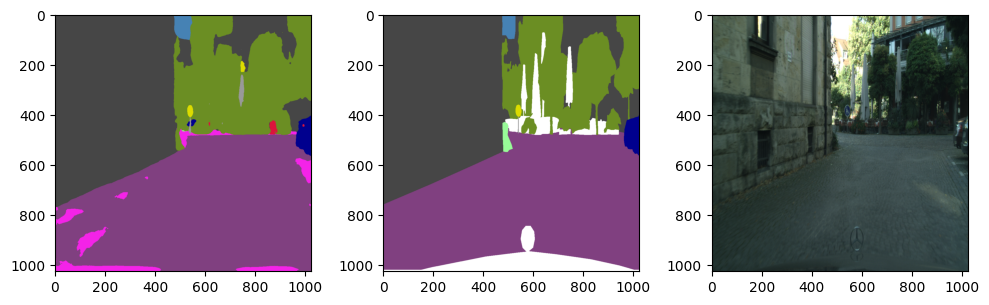

Overall:-
{'mean_accuracy': 0.8310884397858547,
 'mean_iou': 0.46656533279912915,
 'overall_accuracy': 0.9470704035426517,
 'per_category_accuracy': array([0.94112096,        nan, 0.95307513,        nan,        nan,
       0.93518519,        nan, 0.9291939 , 0.96620991, 0.        ,
       0.97454702,        nan,        nan, 0.94937541,        nan,
              nan,        nan,        nan,        nan,        nan]),
 'per_category_iou': array([0.86355001, 0.        , 0.90743813,        nan,        nan,
       0.08581138,        nan, 0.519805  , 0.75528716, 0.        ,
       0.70406732, 0.        ,        nan, 0.82969432,        nan,
              nan,        nan,        nan,        nan,        nan])}
 
Cross Entropy Loss: 0.1974201798439026
 


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>                                                                                      │
│                                                                                                  │
│    7 for ix, batch in enumerate(tqdm(loader)):                                                   │
│    8 #     batch_iou = load("mean_iou")                                                          │
│    9 │   start = time.time()                                                                     │
│ ❱ 10 │   y = model(batch)                                                                        │
│   11 │   print(y.shape)                                                                          │
│   12 │   pred = torch.argmax(F.softmax(y, 1), 1)                                                 │
│   13 │   mean_iou.add_batch(predictions=pred, references=batch['mask'])                          │
│                                                                                                  │
│ /Users/aneeshaparajit/miniconda3/lib/python3.10/site-packages/torch/nn/modules/module.py:1501 in │
│ _call_impl                                                                                       │
│                                                                                                  │
│   1498 │   │   if not (self._backward_hooks or self._backward_pre_hooks or self._forward_hooks   │
│   1499 │   │   │   │   or _global_backward_pre_hooks or _global_backward_hooks                   │
│   1500 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1501 │   │   │   return forward_call(*args, **kwargs)                                          │
│   1502 │   │   # Do not call functions when jit is used                                          │
│   1503 │   │   full_backward_hooks, non_full_backward_hooks = [], []                             │
│   1504 │   │   backward_pre_hooks = []                                                           │
│                                                                                                  │
│ in forward                                                                                       │
│                                                                                                  │
│    7 │   │   )                                                                                   │
│    8 │                                                                                           │
│    9 │   def forward(self, batch: Dict[str, torch.Tensor]) -> torch.Tensor:                      │
│ ❱ 10 │   │   outputs = self.model(pixel_values=batch['image'])                                   │
│   11 │   │                                                                                       │
│   12 │   │   upsampled_logits = F.interpolate(                                                   │
│   13 │   │   │   outputs.logits,                                                                 │
│                                                                                                  │
│ /Users/aneeshaparajit/miniconda3/lib/python3.10/site-packages/torch/nn/modules/module.py:1501 in │
│ _call_impl                                                                                       │
│                                                                                                  │
│   1498 │   │   if not (self._backward_hooks or self._backward_pre_hooks or self._forward_hooks   │
│   1499 │   │   │   │   or _global_backward_pre_hooks or _global_backward_hooks                   │
│   1500 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1501 │   │   │   return forward_call(*args, **kwargs)                                          │
│   1502 │   │   # Do not call functions when jit is used    

In [26]:
mean_iou = load("mean_iou")
jaccard  = smp.losses.JaccardLoss(mode="multiclass")
model = SegmentationModel()
dataset = CityScapesDataset(image_paths, label_paths, image_size=1024, stage="valid")
loader = data.DataLoader(dataset, batch_size=1, shuffle=True)

for ix, batch in enumerate(tqdm(loader)):
#     batch_iou = load("mean_iou")
    start = time.time()
    y = model(batch)
    print(y.shape)
    pred = torch.argmax(F.softmax(y, 1), 1)
    mean_iou.add_batch(predictions=pred, references=batch['mask'])
#     batch_iou.add_batch(predictions=pred, references=batch['mask'])
    
    
    new_mask = torch.stack([pred[0]]*3, axis=-1)

    for k, v in dataset.cmap.items():
        # print(k, v)
        new_mask = new_mask.where(new_mask != k, torch.LongTensor(v))
    
    stop = time.time()
    
    print(f'Execution Time: {stop - start}')
    
    plt.figure(figsize=(10, 5))
    plt.subplot(131)
    plt.imshow(new_mask)
    plt.subplot(132)
    plt.imshow(batch['colored'][0])
    plt.subplot(133)
    plt.imshow((batch['image'][0].permute(1,2,0).numpy() * 255).astype(np.uint8))
    plt.tight_layout()
    plt.show()
    
    print(f'Overall:-')
    pprint(mean_iou.compute(num_labels=20, ignore_index=19, reduce_labels=False))
    print(' ')
    print(f'Cross Entropy Loss: {loss_fct(y, batch["mask"].to(dtype=torch.long))}')
    print(' ')
#     print(f'M-IoU: {mean_iou.getIou()}')
#     jaccard()
#     print(f'Jaccard: {jaccard(y_pred=pred, y_true=batch["mask"])}')

    gc.collect()